In [1]:
!pwd

/mnt/home/eneubeck/GADME


In [2]:
# Importe 
# dauert länger

import transformers
import torch

import logging 
from birdset.datamodule.birdset_datamodule import BirdSetDataModule

import torch.nn.functional as F
from PIL import Image

import os
import json
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

import torchvision
from torchvision import models
from torchvision import transforms

from torchaudio.transforms import Spectrogram, MelScale

from pytorch_lightning import Callback

import librosa.display
import matplotlib.pyplot as plt

from omegaconf import DictConfig

from captum.attr import IntegratedGradients
from captum.attr import GradientShap
from captum.attr import LRP
from captum.attr import Occlusion
from captum.attr import NoiseTunnel
from captum.attr import Saliency
from captum.attr import visualization as viz
from captum.attr._utils.lrp_rules import EpsilonRule, GammaRule, Alpha1_Beta0_Rule


import matplotlib.pyplot as plt
import numpy as np
import librosa
from captum.attr import visualization as viz
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import FuncFormatter

import pickle

In [3]:
# dauert länger
# !nvidia-smi

In [4]:
# print(torch.cuda.is_available())

# 1- Loading the datasets and the models

## 1.1 Die Daten

### 1.1.1 Hydra (in XAI-data.ipynb)

### 1.1.2 Datamodules (in XAI-data.ipynb)

### 1.1.3 Daten holen

In [5]:
# Train Batches

# efficientnet:
eff_train_batch1 = torch.load('/mnt/home/eneubeck/GADME/XAI/eff_train_batch1.pth')
eff_train_batch2 = torch.load('/mnt/home/eneubeck/GADME/XAI/eff_train_batch2.pth')

# ast
ast_train_batch1 = torch.load('/mnt/home/eneubeck/GADME/XAI/ast_train_batch1.pth')
ast_train_batch2 = torch.load('/mnt/home/eneubeck/GADME/XAI/ast_train_batch2.pth')

# w2v2
w2v2_train_batch1 = torch.load('/mnt/home/eneubeck/GADME/XAI/w2v2_train_batch1.pth')
w2v2_train_batch2 = torch.load('/mnt/home/eneubeck/GADME/XAI/w2v2_train_batch2.pth')

print(eff_train_batch1.keys(), eff_train_batch1["input_values"].shape, eff_train_batch1["labels"].shape)
# pro Batch 64 Samples mit Bildgröße 128 8von n_mels) x1024 (von target_width) und 21 Labels

dict_keys(['input_values', 'labels']) torch.Size([64, 1, 128, 1024]) torch.Size([64, 21])


In [6]:
# Test Batches

# efficientnet:
eff_test_batch1 = torch.load('/mnt/home/eneubeck/GADME/XAI/eff_test_batch1.pth')
eff_test_batch2 = torch.load('/mnt/home/eneubeck/GADME/XAI/eff_test_batch2.pth')

# ast
ast_test_batch1 = torch.load('/mnt/home/eneubeck/GADME/XAI/ast_test_batch1.pth')
ast_test_batch2 = torch.load('/mnt/home/eneubeck/GADME/XAI/ast_test_batch2.pth')

# w2v2
w2v2_test_batch1 = torch.load('/mnt/home/eneubeck/GADME/XAI/w2v2_test_batch1.pth')
w2v2_test_batch2 = torch.load('/mnt/home/eneubeck/GADME/XAI/w2v2_test_batch2.pth')

print(eff_test_batch1.keys(), eff_test_batch1["input_values"].shape, eff_test_batch1["labels"].shape)

dict_keys(['input_values', 'labels']) torch.Size([64, 1, 128, 1024]) torch.Size([64, 21])


In [7]:
# Werte aus der audio_config.json Konfigurationsdatei holen

import json

# Laden der Daten aus der JSON-Datei
with open('/mnt/home/eneubeck/GADME/XAI/audio_config.json', 'r') as f:
    audio_config = json.load(f)

# Zugriff auf die geladenen Werte
n_fft = audio_config["n_fft"]
hop_length = audio_config["hop_length"]
sample_rate = audio_config["sample_rate"]
n_mels = audio_config["n_mels"]

print("Geladene Werte:", n_fft, hop_length, sample_rate, n_mels)

Geladene Werte: 1024 320 32000 128


In [8]:
mel_frequencies = librosa.mel_frequencies(n_mels=n_mels)
highest_mel_frequency = mel_frequencies[-1]
print("highest_mel_frequency", highest_mel_frequency, "Hz")

highest_mel_frequency 11025.0 Hz


In [9]:
# w2v2 Werte aus GADME/configs/module/network/wav2vec2.yaml
sampling_rate = 16000

#model_name: wav2vec2
#model_type: waveform
#torch_compile: False
#sampling_rate: 16_000
#normalize_spectrogram: False
#normalize_waveform: instance_normalization

### 1.1.4 Spektrogramm

In [10]:
# def 

def show_spectrogram(spektrum, sr, hop_length, n_fft, titel='Mel-Spektrogramm', cmap="viridis"):
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(spektrum, 
                             y_axis='mel', sr=sample_rate, hop_length=hop_length, n_fft=n_fft,  
                             x_axis='time', cmap=cmap)
    plt.colorbar(format='%+2.0f dB')
    plt.title(titel)
    plt.tight_layout()
    plt.show()


### 1.1.5 Überprüfung der Daten

In [11]:
# wie sieht ein w2v2 sample aus? Audio-Waveformen

w2v2_train_batch1_example_number = 4

w2v2_example = w2v2_train_batch1["input_values"][w2v2_train_batch1_example_number]
w2v2_example_labels = w2v2_train_batch1["labels"][w2v2_train_batch1_example_number]

print(w2v2_example_labels.shape)
print(w2v2_example_labels)
print(w2v2_example.shape)
print(w2v2_example)

torch.Size([21])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
        0., 0., 0.], dtype=torch.float16)
torch.Size([1, 80000])
tensor([[-0.1232, -0.0701, -0.0532,  ..., -0.0519, -0.0263, -0.0565]])


true_label eff: 20
check (must be same) true_label ast: 20
check (must be same) w2v2_example_true_labels tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
        0., 0., 0.], dtype=torch.float16)
eff_train_batch1_example_np.shape (128, 1024)


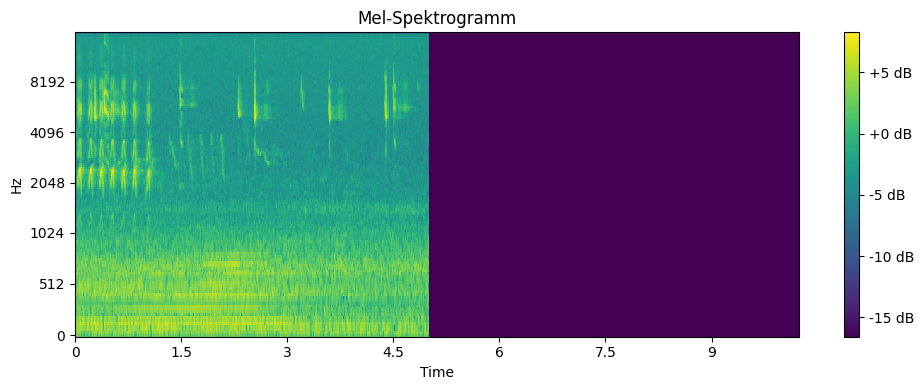

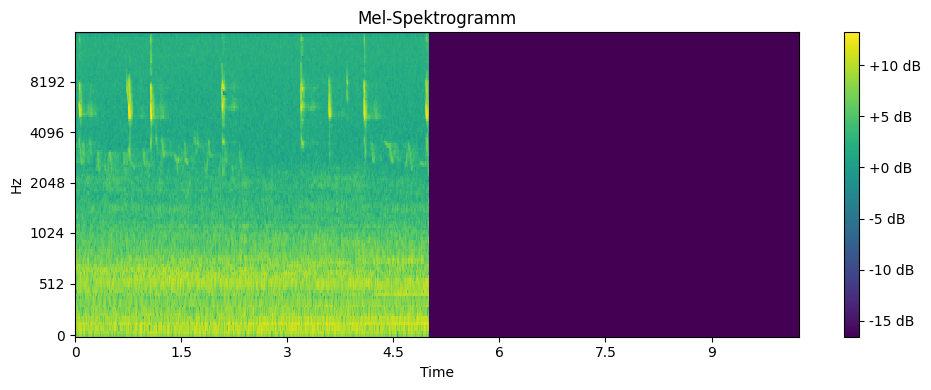

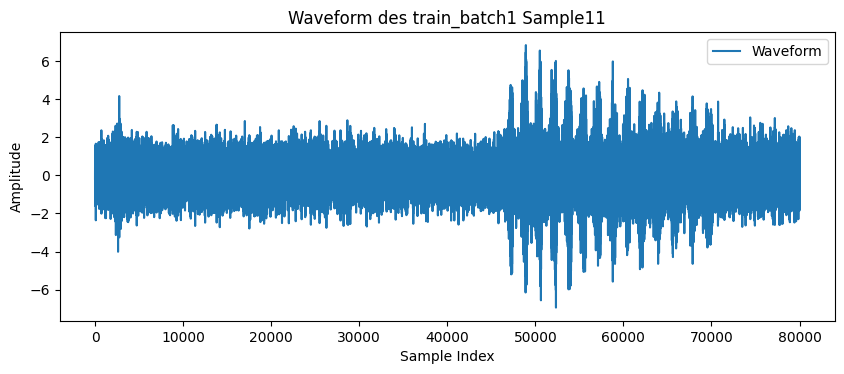

In [14]:
# show both spectrograms and waveform of a sample in train_batch1

train_batch1_example_number = 11

#eff_train_batch1_example = eff_train_batch1["input_values"][train_batch1_example_number]
eff_train_batch1_example_np = np.squeeze(eff_train_batch1["input_values"][train_batch1_example_number].numpy())
eff_train_batch1_example_true_label = torch.argmax(eff_train_batch1["labels"][train_batch1_example_number]) # Index des höchsten Werts

ast_train_batch1_example_np = np.squeeze(ast_train_batch1["input_values"][train_batch1_example_number].numpy())
ast_train_batch1_example_true_label = torch.argmax(ast_train_batch1["labels"][train_batch1_example_number]) # Index des höchsten Werts

w2v2_example = w2v2_train_batch1["input_values"][train_batch1_example_number]
w2v2_example_np = w2v2_example.detach().cpu().numpy()
w2v2_example_true_labels = w2v2_train_batch1["labels"][train_batch1_example_number]

print(f"true_label eff: {eff_train_batch1_example_true_label.item()}")
print(f"check (must be same) true_label ast: {ast_train_batch1_example_true_label.item()}")
print("check (must be same) w2v2_example_true_labels", w2v2_example_true_labels)
#print(f"predicted_label EfficientNet: {loaded_eff_train_batch1_prediction_label_indexes[train_batch1_example_number]}")
#print(f"predicted_score EfficientNet: {loaded_eff_train_batch1_prediction_scores[train_batch1_example_number]}")
#print(f"predicted_label Ast: {loaded_ast_train_batch1_prediction_label_indexes[train_batch1_example_number]}")
#print(f"predicted_score Ast: {loaded_ast_train_batch1_prediction_scores[train_batch1_example_number]}")

# print("eff_train_batch1_example_np.shape", eff_train_batch1_example_np.shape)
show_spectrogram(eff_train_batch1_example_np, sr=sample_rate, hop_length=hop_length, n_fft=n_fft)
show_spectrogram(ast_train_batch1_example_np, sr=sample_rate, hop_length=hop_length, n_fft=n_fft)

# w2v2 plot
plt.figure(figsize=(10, 3.75))  # Größe des Plots
plt.plot(w2v2_example_np[0], label='Waveform')  # Zeichnen der ersten Dimension des Tensors
plt.title(f'Waveform des train_batch1 Sample{train_batch1_example_number}')
plt.xlabel('Sample Index')
plt.ylabel('Amplitude')
plt.legend()
plt.show()

## 1.2 Mapping of Labels to eBird Codes

## 1.3 Die Modelle

In [13]:
# EfficientNet Modell
# dauert kurz

# EfficientNetClassifier importieren
from birdset.modules.models.efficientnet import EfficientNetClassifier

# Definition der Parameter
num_classes = 21 # The number of classes for the output layer
num_channels = 1  # The number of input channels  # 1 für Für Graustufenbildern 
checkpoint_path = "logs/train/runs/HSN/efficientnet/2024-04-25_140516/callback_checkpoints/efficientnet_HSN_32.ckpt"

efficientnet_model = EfficientNetClassifier(
    num_classes=num_classes,
    num_channels=num_channels,
    checkpoint = "google/efficientnet-b1",
    local_checkpoint=checkpoint_path)

efficientnet_model = efficientnet_model.eval()

print("done")

done


In [14]:
# AST Modell
# dauert kurz

# EfficientNetClassifier importieren
from birdset.modules.models.ast import ASTSequenceClassifier

# Define the pretrain_info structure
class PretrainInfoAst:
    def __init__(self, hf_path, hf_name=None, hf_pretrain_name=None):
        self.hf_path = hf_path
        self.hf_name = hf_name
        self.hf_pretrain_name = hf_pretrain_name

#
pretrain_info_ast = PretrainInfoAst(
    hf_path="DBD-research-group/BirdSet",
    hf_name="HSN"
    # hf_pretrain = None
)

# Definition der Parameter
num_classes = 21 # The number of classes for the output layer
num_channels = 1  # The number of input channels  # 1 für Für Graustufenbildern
# TODO
checkpoint_path_ast = "logs/train/runs/HSN/ast/2024-05-02_165811/callback_checkpoints/ast_HSN_14.ckpt"

ast_model = ASTSequenceClassifier(
    num_classes=num_classes,
    # num_channels=num_channels,
    checkpoint = "MIT/ast-finetuned-audioset-10-10-0.4593" ,
    local_checkpoint = checkpoint_path_ast,
    cache_dir = None,
    pretrain_info = pretrain_info_ast
    )

ast_model = ast_model.eval()

print("done")

done


In [15]:
# Wav2Vec2 Modell
# dauert kurz

# EfficientNetClassifier importieren
from birdset.modules.models.wav2vec2 import Wav2vec2SequenceClassifier

# Define the pretrain_info structure
class PretrainInfo:
    def __init__(self, hf_path, hf_name=None, hf_pretrain_name=None):
        self.hf_path = hf_path
        self.hf_name = hf_name
        self.hf_pretrain_name = hf_pretrain_name

#
pretrain_info = PretrainInfo(
    hf_path="DBD-research-group/BirdSet",
    hf_name="HSN"
    # hf_pretrain = None
)

# Definition der Parameter
num_classes = 21 # The number of classes for the output layer
num_channels = 1  # The number of input channels  # 1 für Für Graustufenbildern
# checkpoint_path = "logs/train/runs/HSN/Wav2vec2/2024-05-15_152417/callback_checkpoints/Wav2vec2_HSN_29.ckpt"
checkpoint_path = "logs/train/runs/HSN/wav2vec2/2024-03-25_102011/callback_checkpoints/wav2vec2_HSN_26.ckpt"

wav2vec2_model = Wav2vec2SequenceClassifier(
    num_classes=num_classes,
    # num_channels=num_channels,
    checkpoint = "facebook/wav2vec2-base",
    local_checkpoint = checkpoint_path,
    cache_dir = None,
    pretrain_info = pretrain_info
)

wav2vec2_model = wav2vec2_model.eval()

print("done")

done


## 1.4 Vorhersagen

### Vorhersagen für die beiden Batches der beiden Modelle aus den Trainings- und Testdaten holen

In [16]:
# Train: Laden der gespeicherten Vorhersagen
# EfficientNet Training Batch 1 und 2
loaded_eff_train_batch1_prediction_scores = torch.load('/mnt/home/eneubeck/GADME/XAI/eff_train_batch1_prediction_scores.pt')
loaded_eff_train_batch1_prediction_label_indexes = torch.load('/mnt/home/eneubeck/GADME/XAI/eff_train_batch1_prediction_label_indexes.pt')
loaded_eff_train_batch1_output_sigmoid = torch.load('/mnt/home/eneubeck/GADME/XAI/eff_train_batch1_output_sigmoid.pt')

loaded_eff_train_batch2_prediction_scores = torch.load('/mnt/home/eneubeck/GADME/XAI/eff_train_batch2_prediction_scores.pt')
loaded_eff_train_batch2_prediction_label_indexes = torch.load('/mnt/home/eneubeck/GADME/XAI/eff_train_batch2_prediction_label_indexes.pt')
loaded_eff_train_batch2_output_sigmoid = torch.load('/mnt/home/eneubeck/GADME/XAI/eff_train_batch2_output_sigmoid.pt')

# AST Training Batch 1 und 2
loaded_ast_train_batch1_prediction_scores = torch.load('/mnt/home/eneubeck/GADME/XAI/ast_train_batch1_prediction_scores.pt')
loaded_ast_train_batch1_prediction_label_indexes = torch.load('/mnt/home/eneubeck/GADME/XAI/ast_train_batch1_prediction_label_indexes.pt')
loaded_ast_train_batch1_output_sigmoid = torch.load('/mnt/home/eneubeck/GADME/XAI/ast_train_batch1_output_sigmoid.pt')

loaded_ast_train_batch2_prediction_scores = torch.load('/mnt/home/eneubeck/GADME/XAI/ast_train_batch2_prediction_scores.pt')
loaded_ast_train_batch2_prediction_label_indexes = torch.load('/mnt/home/eneubeck/GADME/XAI/ast_train_batch2_prediction_label_indexes.pt')
loaded_ast_train_batch2_output_sigmoid = torch.load('/mnt/home/eneubeck/GADME/XAI/ast_train_batch2_output_sigmoid.pt')

# w2v2 Training Batch 1 und 2
loaded_w2v2_train_batch1_prediction_scores = torch.load('/mnt/home/eneubeck/GADME/XAI/w2v2_train_batch1_prediction_scores.pt')
loaded_w2v2_train_batch1_prediction_label_indexes = torch.load('/mnt/home/eneubeck/GADME/XAI/w2v2_train_batch1_prediction_label_indexes.pt')
loaded_w2v2_train_batch1_output_sigmoid = torch.load('/mnt/home/eneubeck/GADME/XAI/w2v2_train_batch1_output_sigmoid.pt')

loaded_w2v2_train_batch2_prediction_scores = torch.load('/mnt/home/eneubeck/GADME/XAI/w2v2_train_batch2_prediction_scores.pt')
loaded_w2v2_train_batch2_prediction_label_indexes = torch.load('/mnt/home/eneubeck/GADME/XAI/w2v2_train_batch2_prediction_label_indexes.pt')
loaded_w2v2_train_batch2_output_sigmoid = torch.load('/mnt/home/eneubeck/GADME/XAI/w2v2_train_batch2_output_sigmoid.pt')

# Ausgabe der geladenen Daten
print("loaded_eff_train_batch1_prediction_scores", loaded_eff_train_batch1_prediction_scores)
print("loaded_eff_train_batch1_prediction_label_indexes", loaded_eff_train_batch1_prediction_label_indexes)
#print("loaded_eff_train_batch1_output_sigmoid", loaded_eff_train_batch1_output_sigmoid)
#print("loaded_eff_train_batch2_prediction_scores", loaded_eff_train_batch2_prediction_scores)
#print("loaded_eff_train_batch2_prediction_label_indexes", loaded_eff_train_batch2_prediction_label_indexes)
#print("loaded_eff_train_batch2_output_sigmoid", loaded_eff_train_batch2_output_sigmoid)

#print("loaded_ast_train_batch1_prediction_scores", loaded_ast_train_batch1_prediction_scores)
#print("loaded_ast_train_batch1_prediction_label_indexes", loaded_ast_train_batch1_prediction_label_indexes)
#print("loaded_ast_train_batch1_output_sigmoid", loaded_ast_train_batch1_output_sigmoid)
#print("loaded_ast_train_batch2_prediction_scores", loaded_ast_train_batch2_prediction_scores)
#print("loaded_ast_train_batch2_prediction_label_indexes", loaded_ast_train_batch2_prediction_label_indexes)
#print("loaded_ast_train_batch2_output_sigmoid", loaded_ast_train_batch2_output_sigmoid)

#print("loaded_w2v2_train_batch1_prediction_scores", loaded_w2v2_train_batch1_prediction_scores)
#print("loaded_w2v2_train_batch1_prediction_label_indexes", loaded_w2v2_train_batch1_prediction_label_indexes)
#print("loaded_w2v2_train_batch1_output_sigmoid", loaded_w2v2_train_batch1_output_sigmoid)
#print("loaded_w2v2_train_batch2_prediction_scores", loaded_w2v2_train_batch2_prediction_scores)
#print("loaded_w2v2_train_batch2_prediction_label_indexes", loaded_w2v2_train_batch2_prediction_label_indexes)
#print("loaded_w2v2_train_batch2_output_sigmoid", loaded_w2v2_train_batch2_output_sigmoid)


loaded_eff_train_batch1_prediction_scores tensor([0.1678, 0.9585, 0.9696, 0.9883, 0.9987, 0.9691, 0.9658, 0.9907, 0.9739,
        0.9818, 0.8756, 0.9923, 0.9991, 0.9993, 0.9778, 0.9006, 0.9967, 0.7567,
        0.9920, 0.9968, 0.7951, 0.9885, 0.4997, 0.9905, 0.7801, 0.9995, 0.9998,
        0.7403, 0.9984, 0.9868, 0.9592, 0.9985, 0.9757, 0.9840, 0.7535, 0.9901,
        0.7466, 0.9845, 0.8019, 0.9944, 0.9612, 0.2272, 0.9095, 0.7861, 0.9913,
        0.8158, 0.9995, 0.9960, 0.3473, 0.9993, 0.9955, 0.9462, 0.9873, 0.9998,
        0.2668, 0.9835, 0.9999, 0.9849, 0.9796, 0.9990, 0.9964, 0.9996, 0.9371,
        0.9970], requires_grad=True)
loaded_eff_train_batch1_prediction_label_indexes tensor([ 1,  6, 14, 13, 19,  1, 17, 19, 11, 12, 13, 20,  5,  2,  1, 11, 13, 20,
        10,  1,  7,  3, 11,  7,  7, 11, 11, 13,  1, 16, 16, 19,  6,  6, 14, 18,
        11, 13, 19,  4, 16, 19, 17,  6,  6, 16, 11, 15,  1, 11, 13, 13, 20,  4,
        19, 13, 17, 17, 14, 19, 19, 19,  6, 19])


In [17]:
# Test: Laden der gespeicherten Vorhersagen

# EfficientNet Test Batch 1 und 2
loaded_eff_test_batch1_prediction_scores = torch.load('/mnt/home/eneubeck/GADME/XAI/eff_test_batch1_prediction_scores.pt')
loaded_eff_test_batch1_prediction_label_indexes = torch.load('/mnt/home/eneubeck/GADME/XAI/eff_test_batch1_prediction_label_indexes.pt')
loaded_eff_test_batch1_output_sigmoid = torch.load('/mnt/home/eneubeck/GADME/XAI/eff_test_batch1_output_sigmoid.pt')

loaded_eff_test_batch2_prediction_scores = torch.load('/mnt/home/eneubeck/GADME/XAI/eff_test_batch2_prediction_scores.pt')
loaded_eff_test_batch2_prediction_label_indexes = torch.load('/mnt/home/eneubeck/GADME/XAI/eff_test_batch2_prediction_label_indexes.pt')
loaded_eff_test_batch2_output_sigmoid = torch.load('/mnt/home/eneubeck/GADME/XAI/eff_test_batch2_output_sigmoid.pt')

# AST Test Batch 1 und 2
loaded_ast_test_batch1_prediction_scores = torch.load('/mnt/home/eneubeck/GADME/XAI/ast_test_batch1_prediction_scores.pt')
loaded_ast_test_batch1_prediction_label_indexes = torch.load('/mnt/home/eneubeck/GADME/XAI/ast_test_batch1_prediction_label_indexes.pt')
loaded_ast_test_batch1_output_sigmoid = torch.load('/mnt/home/eneubeck/GADME/XAI/ast_test_batch1_output_sigmoid.pt')

loaded_ast_test_batch2_prediction_scores = torch.load('/mnt/home/eneubeck/GADME/XAI/ast_test_batch2_prediction_scores.pt')
loaded_ast_test_batch2_prediction_label_indexes = torch.load('/mnt/home/eneubeck/GADME/XAI/ast_test_batch2_prediction_label_indexes.pt')
loaded_ast_test_batch2_output_sigmoid = torch.load('/mnt/home/eneubeck/GADME/XAI/ast_test_batch2_output_sigmoid.pt')

# w2v2 Test Batch 1 und 2
loaded_w2v2_test_batch1_prediction_scores = torch.load('/mnt/home/eneubeck/GADME/XAI/w2v2_test_batch1_prediction_scores.pt')
loaded_w2v2_test_batch1_prediction_label_indexes = torch.load('/mnt/home/eneubeck/GADME/XAI/w2v2_test_batch1_prediction_label_indexes.pt')
loaded_w2v2_test_batch1_output_sigmoid = torch.load('/mnt/home/eneubeck/GADME/XAI/w2v2_test_batch1_output_sigmoid.pt')

loaded_w2v2_test_batch2_prediction_scores = torch.load('/mnt/home/eneubeck/GADME/XAI/w2v2_test_batch2_prediction_scores.pt')
loaded_w2v2_test_batch2_prediction_label_indexes = torch.load('/mnt/home/eneubeck/GADME/XAI/w2v2_test_batch2_prediction_label_indexes.pt')
loaded_w2v2_test_batch2_output_sigmoid = torch.load('/mnt/home/eneubeck/GADME/XAI/w2v2_test_batch2_output_sigmoid.pt')

# Ausgabe der geladenen Daten
print("loaded_eff_test_batch1_prediction_scores", loaded_eff_test_batch1_prediction_scores)
print("loaded_eff_test_batch1_prediction_label_indexes", loaded_eff_test_batch1_prediction_label_indexes)
# print("loaded_eff_test_batch1_output_sigmoid", loaded_eff_test_batch1_output_sigmoid)
# print("loaded_eff_test_batch2_prediction_scores", loaded_eff_test_batch2_prediction_scores)
# print("loaded_eff_test_batch2_prediction_label_indexes", loaded_eff_test_batch2_prediction_label_indexes)
# print("loaded_eff_test_batch2_output_sigmoid", loaded_eff_test_batch2_output_sigmoid)

# print("loaded_ast_test_batch1_prediction_scores", loaded_ast_test_batch1_prediction_scores)
# print("loaded_ast_test_batch1_prediction_label_indexes", loaded_ast_test_batch1_prediction_label_indexes)
# print("loaded_ast_test_batch1_output_sigmoid", loaded_ast_test_batch1_output_sigmoid)
# print("loaded_ast_test_batch2_prediction_scores", loaded_ast_test_batch2_prediction_scores)
# print("loaded_ast_test_batch2_prediction_label_indexes", loaded_ast_test_batch2_prediction_label_indexes)
# print("loaded_ast_test_batch2_output_sigmoid", loaded_ast_test_batch2_output_sigmoid)

# print("loaded_w2v2_test_batch1_prediction_scores", loaded_w2v2_test_batch1_prediction_scores)
# print("loaded_w2v2_test_batch1_prediction_label_indexes", loaded_w2v2_test_batch1_prediction_label_indexes)
# print("loaded_w2v2_test_batch1_output_sigmoid", loaded_w2v2_test_batch1_output_sigmoid)
# print("loaded_w2v2_test_batch2_prediction_scores", loaded_w2v2_test_batch2_prediction_scores)
# print("loaded_w2v2_test_batch2_prediction_label_indexes", loaded_w2v2_test_batch2_prediction_label_indexes)
# print("loaded_w2v2_test_batch2_output_sigmoid", loaded_w2v2_test_batch2_output_sigmoid)

loaded_eff_test_batch1_prediction_scores tensor([0.2096, 0.3075, 0.3073, 0.3070, 0.3067, 0.3069, 0.3072, 0.3065, 0.4050,
        0.3075, 0.3061, 0.3067, 0.3063, 0.3063, 0.2582, 0.3076, 0.3052, 0.3063,
        0.2072, 0.1881, 0.3054, 0.1455, 0.2986, 0.2576, 0.3095, 0.2449, 0.3325,
        0.3065, 0.2595, 0.2573, 0.1956, 0.8868, 0.2814, 0.3044, 0.3041, 0.3058,
        0.2452, 0.3053, 0.3057, 0.3064, 0.3047, 0.3062, 0.3051, 0.3062, 0.3063,
        0.2625, 0.5426, 0.8556, 0.7644, 0.9015, 0.2390, 0.9703, 0.3062, 0.9762,
        0.3070, 0.9566, 0.3060, 0.3087, 0.9619, 0.3068, 0.3072, 0.1879, 0.2836,
        0.9190], requires_grad=True)
loaded_eff_test_batch1_prediction_label_indexes tensor([11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11,
         1,  1,  2, 11,  1, 11, 11, 11, 11, 11, 11, 11,  3,  3, 11, 11, 11, 11,
        11, 11, 11, 11, 11, 11, 11, 11, 11, 11,  3,  1,  2,  1,  2,  1, 11,  1,
        11,  1, 11, 11,  1, 11, 11, 11, 11,  1])


## 1.5 Geeignete Samples für die Auswertung auswählen

Ziel:
3 Trainingssamples, 3 Testsamples
davon je eins mit korrekten Vorhersagen von allen 2 Modellen
je eins mit falschen Vorhersagen von allen 2 Modellen
je eins mit falscher Vorhersage eines der 2 Modelle

In [18]:
# Welche Vorhersagen sind korrekt? def
def find_samples(batch_eff, batch_ast, predictions_eff, predictions_ast):
    # categorizes the predictions the 2 models made for a batch into 4 categories: correct_both, wrong_both, eff_wrong, ast_wrong
    both_correct = []
    eff_correct_ast_wrong = []
    eff_wrong_ast_correct = []
    both_wrong = []
        
    true_labels_eff = batch_eff ['labels']  # Zugriff auf die tatsächlichen Label-Tensoren
    true_labels_ast = batch_ast ['labels']
        
    # Überprüfen jedes Samples in dem Batch
    for sample_idx in range(true_labels_eff.shape[0]):
        pred_label_index_eff = predictions_eff[sample_idx]  # Vorhergesagter Index von EfficientNet
        pred_label_index_ast = predictions_ast[sample_idx]  # Vorhergesagter Index von AST
        true_label_eff = true_labels_eff[sample_idx].argmax()
        true_label_ast = true_labels_ast[sample_idx].argmax()
        
        # Überprüfen der Korrektheit der Vorhersage für beide Modelle
        is_correct_eff = (pred_label_index_eff == true_label_eff)
        is_correct_ast = (pred_label_index_ast == true_label_ast)

        # Überprüfen, ob die Vorhersagen von beiden Modellen korrekt sind
        if is_correct_eff and is_correct_ast:
            both_correct.append(sample_idx)

        # Überprüfen, ob die Vorhersagen von beiden Modellen falsch sind
        elif not is_correct_eff and not is_correct_ast:
            both_wrong.append(sample_idx)
            
        # Überprüfen, ob die Vorhersage vom Ast Modell falsch ist
        elif is_correct_eff and not is_correct_ast:
            eff_correct_ast_wrong.append(sample_idx)
            
        # Überprüfen, ob die Vorhersage vom EfficientNet Modell falsch ist
        elif is_correct_ast and not is_correct_eff:
            eff_wrong_ast_correct.append(sample_idx)


    return both_correct, eff_correct_ast_wrong, eff_wrong_ast_correct, both_wrong

### 1.5.1 Geeignete Samples Train Batch 1

In [19]:
# Hinweis: Bei den Traindaten müssen die geeigneten Samples neu ausgesucht werden, sobald die Datamodules neu geladen wurden.
# Grund: die Augmentations in der Vorverarbeitung führen zu veränderten Original-Spektrogrammen.


# wo sind die Prediction-Werte niedrig? 
for index, value in enumerate(loaded_eff_train_batch1_prediction_scores):
    if value < 0.5:
        print(f"eff_train_batch1 Prediction-Wert < 0.5 an Index: {index}, Wert: {value.item():.4f}")

print()
for index, value in enumerate(loaded_ast_train_batch1_prediction_scores):
    if value < 0.5:
        print(f"ast_train_batch1 Prediction-Wert < 0.5 an Index: {index}, Wert: {value.item():.4f}")
print()
print()

# Vergleich der Scores eff/ast train_batch1
# wo war eff gut und ast gut?
indices_eff_ast_good_train_batch1 = []
for index, (eff, ast) in enumerate(zip(loaded_eff_train_batch1_prediction_scores, loaded_ast_train_batch1_prediction_scores)):
    if eff > 0.98 and ast > 0.98:
        indices_eff_ast_good_train_batch1.append(index)
# wo war eff gut und ast schlecht?
indices_eff_good_train_batch1 = []
for index, (eff, ast) in enumerate(zip(loaded_eff_train_batch1_prediction_scores, loaded_ast_train_batch1_prediction_scores)):
    if eff > 0.9 and ast < 0.7:
        indices_eff_good_train_batch1.append(index)
# wo war eff schlecht und ast gut?
indices_ast_good_train_batch1 = []
for index, (eff, ast) in enumerate(zip(loaded_eff_train_batch1_prediction_scores, loaded_ast_train_batch1_prediction_scores)):
    if eff < 0.7 and ast > 0.9 :
        indices_ast_good_train_batch1.append(index)
# wo waren eff und ast beide schlecht?
indices_eff_ast_bad_train_batch1 = []
for index, (eff, ast) in enumerate(zip(loaded_eff_train_batch1_prediction_scores, loaded_ast_train_batch1_prediction_scores)):
    if eff < 0.6 and ast < 0.6:
        indices_eff_ast_bad_train_batch1.append(index)


# Wo wurde korrekt und wo falsch klassifiziert? Which predictions eff/ast are correct?

both_correct_train_batch1, eff_correct_ast_wrong_train_batch1, \
eff_wrong_ast_correct_train_batch1, both_wrong_train_batch1 = \
find_samples(
    eff_train_batch1, 
    ast_train_batch1, 
    loaded_eff_train_batch1_prediction_label_indexes,  
    loaded_ast_train_batch1_prediction_label_indexes 
)

print("both high scores (both scores > 0.98):", indices_eff_ast_good_train_batch1)
print("only eff high score (eff-score > 0.9 and ast-score < 0.7):", indices_eff_good_train_batch1)
print("only ast high score (ast-score > 0.9 and eff-score < 0.7):", indices_ast_good_train_batch1)
print("both low scores (both scores < 0.6):", indices_eff_ast_bad_train_batch1)
print()
print()
print("both_correct_train_batch1: ", both_correct_train_batch1)
print("eff_correct_ast_wrong_train_batch1:", eff_correct_ast_wrong_train_batch1)
print("eff_wrong_ast_correct_train_batch1:", eff_wrong_ast_correct_train_batch1)
print("both_wrong_train_batch1:", both_wrong_train_batch1)

eff_train_batch1 Prediction-Wert < 0.5 an Index: 0, Wert: 0.1678
eff_train_batch1 Prediction-Wert < 0.5 an Index: 22, Wert: 0.4997
eff_train_batch1 Prediction-Wert < 0.5 an Index: 41, Wert: 0.2272
eff_train_batch1 Prediction-Wert < 0.5 an Index: 48, Wert: 0.3473
eff_train_batch1 Prediction-Wert < 0.5 an Index: 54, Wert: 0.2668

ast_train_batch1 Prediction-Wert < 0.5 an Index: 11, Wert: 0.3082
ast_train_batch1 Prediction-Wert < 0.5 an Index: 40, Wert: 0.4960
ast_train_batch1 Prediction-Wert < 0.5 an Index: 63, Wert: 0.4868


both high scores (both scores > 0.98): [4, 16, 23, 25, 26, 28, 31, 37, 46, 49, 50, 56, 61]
only eff high score (eff-score > 0.9 and ast-score < 0.7): [2, 11, 40, 63]
only ast high score (ast-score > 0.9 and eff-score < 0.7): [48]
both low scores (both scores < 0.6): [0]


both_correct_train_batch1:  [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 42, 43, 44, 45, 46, 47, 48, 49, 5

true_label eff: 20
check (must be same) true_label ast: 20
predicted_label EfficientNet: 19
predicted_score EfficientNet: 0.22724483907222748
predicted_label Ast: 1
predicted_score Ast: 0.6349721550941467


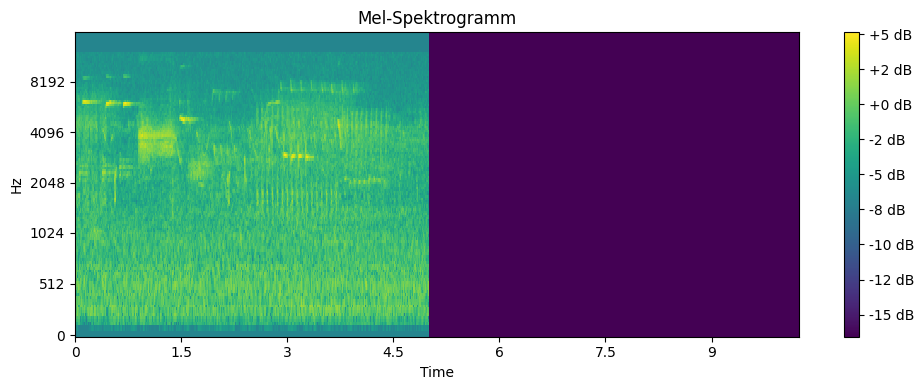

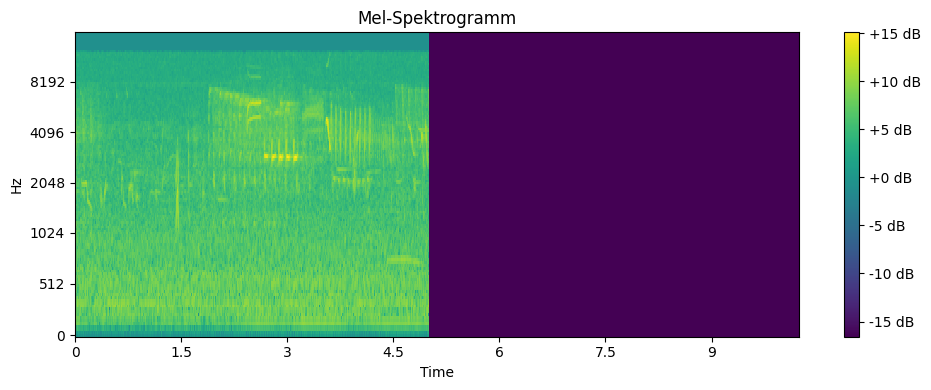

In [20]:
# show both spectrograms of a sample in train_batch1

train_batch1_example_number = 41

#eff_train_batch1_example = eff_train_batch1["input_values"][train_batch1_example_number]
eff_train_batch1_example_np = np.squeeze(eff_train_batch1["input_values"][train_batch1_example_number].numpy())
eff_train_batch1_example_true_label = torch.argmax(eff_train_batch1["labels"][train_batch1_example_number]) # Index des höchsten Werts

ast_train_batch1_example_np = np.squeeze(ast_train_batch1["input_values"][train_batch1_example_number].numpy())
ast_train_batch1_example_true_label = torch.argmax(ast_train_batch1["labels"][train_batch1_example_number]) # Index des höchsten Werts

print(f"true_label eff: {eff_train_batch1_example_true_label.item()}")
print(f"check (must be same) true_label ast: {ast_train_batch1_example_true_label.item()}")
print(f"predicted_label EfficientNet: {loaded_eff_train_batch1_prediction_label_indexes[train_batch1_example_number]}")
print(f"predicted_score EfficientNet: {loaded_eff_train_batch1_prediction_scores[train_batch1_example_number]}")
print(f"predicted_label Ast: {loaded_ast_train_batch1_prediction_label_indexes[train_batch1_example_number]}")
print(f"predicted_score Ast: {loaded_ast_train_batch1_prediction_scores[train_batch1_example_number]}")


show_spectrogram(eff_train_batch1_example_np, sr=sample_rate, hop_length=hop_length, n_fft=n_fft)
show_spectrogram(ast_train_batch1_example_np, sr=sample_rate, hop_length=hop_length, n_fft=n_fft)

### 1.5.2 Geeignete Samples Test Batch 1

In [21]:
# Infor über No Label Samples

batches = [
    ("eff_test_batch1", eff_test_batch1['labels'], loaded_eff_test_batch1_prediction_scores),
    ("ast_test_batch1", ast_test_batch1['labels'], loaded_ast_test_batch1_prediction_scores),
    #("eff_test_batch2", eff_test_batch2['labels'], loaded_eff_test_batch2_prediction_scores),
    #("ast_test_batch2", ast_test_batch2['labels'], loaded_ast_test_batch2_prediction_scores)
]

# Listen für eff und ast um 3er-Tupeln zu speichern
eff_no_label_info = []
ast_no_label_info = []

# Durchgehen jeder Batch-Bezeichnung, Labels und zugehörige Scores
for batch_name, labels, scores in batches:
    
    no_label_indices = []  # Liste für Samples ohne Labels
    
    # Durchgehen jedes Vektors in den Labels
    for index, label in enumerate(labels):
        # Ermitteln der Indizes aller Einsen
        indices = (label == 1).nonzero(as_tuple=True)[0]
        # Umwandeln in ein Tupel
        indices_tuple = tuple(indices.tolist())
        # Überprüfen, ob das Tupel leer ist (keine Einsen)
        if not indices_tuple:
            no_label_indices.append(index)  # Fügen den Index zur Liste der no-label indices hinzu            
            # Entscheidung, in welche Liste das Tupel eingefügt wird
            if 'eff' in batch_name:
                eff_no_label_info.append((index, indices_tuple, scores[index].item()))
            elif 'ast' in batch_name:
                ast_no_label_info.append((index, indices_tuple, scores[index].item()))

print("no_label_indices", no_label_indices)
# Ausgabe der gesammelten 3er-Tupel für eff und ast
print("EFF No Label Information: Index, true_labels, score")
print(eff_no_label_info)
print()
print("AST No Label Information:")
print(ast_no_label_info)

no_label_indices [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 25, 26, 27, 28, 29, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 52, 54, 56, 59, 60, 62]
EFF No Label Information: Index, true_labels, score
[(2, (), 0.307295560836792), (3, (), 0.30697351694107056), (4, (), 0.30669063329696655), (5, (), 0.3068839907646179), (6, (), 0.30719754099845886), (7, (), 0.306522935628891), (8, (), 0.4049915671348572), (9, (), 0.3075083792209625), (10, (), 0.3061498701572418), (11, (), 0.3067249059677124), (12, (), 0.3063407242298126), (13, (), 0.3062932789325714), (15, (), 0.3075751066207886), (16, (), 0.3051944077014923), (17, (), 0.30634260177612305), (25, (), 0.2449440360069275), (26, (), 0.3325171172618866), (27, (), 0.3064708411693573), (28, (), 0.25954297184944153), (29, (), 0.25728705525398254), (32, (), 0.2813645899295807), (33, (), 0.3044104278087616), (34, (), 0.30408599972724915), (35, (), 0.3057703971862793), (36, (), 0.24523670971393585), (37, (), 0.3053428828716278),

In [22]:
# wo sind die Prediction-Werte niedrig? 
for index, value in enumerate(loaded_eff_test_batch1_prediction_scores):
    if value < 0.5 and index not in no_label_indices:
        print(f"eff_test_batch1 Prediction-Wert < 0.5 an Index: {index}, Wert: {value.item():.4f}")

print()
for index, value in enumerate(loaded_ast_test_batch1_prediction_scores):
    if value < 0.5  and index not in no_label_indices:
        print(f"ast_test_batch1 Prediction-Wert < 0.5 an Index: {index}, Wert: {value.item():.4f}")
print()
print()

# Vergleich der Scores eff/ast test_batch1
# wo war eff gut und ast gut?
indices_eff_ast_good_test_batch1 = []
for index, (eff, ast) in enumerate(zip(loaded_eff_test_batch1_prediction_scores, loaded_ast_test_batch1_prediction_scores)):
    if eff > 0.8 and ast > 0.8:
        indices_eff_ast_good_test_batch1.append(index)
# wo war eff gut und ast schlecht?
indices_eff_good_test_batch1 = []
for index, (eff, ast) in enumerate(zip(loaded_eff_test_batch1_prediction_scores, loaded_ast_test_batch1_prediction_scores)):
    if eff > 0.7 and ast < 0.6:
        indices_eff_good_test_batch1.append(index)
# wo war eff schlecht und ast gut?
indices_ast_good_test_batch1 = []
for index, (eff, ast) in enumerate(zip(loaded_eff_test_batch1_prediction_scores, loaded_ast_test_batch1_prediction_scores)):
    if eff < 0.6 and ast > 0.8 :
        indices_ast_good_test_batch1.append(index)
# wo waren eff und ast beide schlecht?
indices_eff_ast_bad_test_batch1 = []
for index, (eff, ast) in enumerate(zip(loaded_eff_test_batch1_prediction_scores, loaded_ast_test_batch1_prediction_scores)):
    if eff < 0.5 and ast < 0.5 and index not in no_label_indices:
        indices_eff_ast_bad_test_batch1.append(index)

# wo war eff überhaupt gut?
indices_eff_08 = []
for index, (eff, ast) in enumerate(zip(loaded_eff_test_batch1_prediction_scores, loaded_ast_test_batch1_prediction_scores)):
    if eff > 0.8 and index not in no_label_indices:
        indices_eff_08.append(index)
indices_eff_07 = []
for index, (eff, ast) in enumerate(zip(loaded_eff_test_batch1_prediction_scores, loaded_ast_test_batch1_prediction_scores)):
    if eff > 0.7 and eff < 0.8 and index not in no_label_indices:
        indices_eff_07.append(index)
indices_eff_05 = []
for index, (eff, ast) in enumerate(zip(loaded_eff_test_batch1_prediction_scores, loaded_ast_test_batch1_prediction_scores)):
    if eff > 0.5 and eff < 0.7 and index not in no_label_indices:
        indices_eff_05.append(index)
indices_eff_04 = []
for index, (eff, ast) in enumerate(zip(loaded_eff_test_batch1_prediction_scores, loaded_ast_test_batch1_prediction_scores)):
    if eff > 0.4 and eff < 0.5 and index not in no_label_indices:
        indices_eff_04.append(index)
indices_eff_lower_04 = []
for index, (eff, ast) in enumerate(zip(loaded_eff_test_batch1_prediction_scores, loaded_ast_test_batch1_prediction_scores)):
    if eff < 0.4 and index not in no_label_indices:
        indices_eff_lower_04.append(index)

# Wo wurde korrekt und wo falsch klassifiziert? Which predictions eff/ast are correct?

both_correct_test_batch1, eff_correct_ast_wrong_test_batch1, \
eff_wrong_ast_correct_test_batch1, both_wrong_test_batch1 = \
find_samples(
    eff_test_batch1, 
    ast_test_batch1, 
    loaded_eff_test_batch1_prediction_label_indexes,  
    loaded_ast_test_batch1_prediction_label_indexes 
)

# Umwandlung der Listen in Sets
both_wrong_set = set(both_wrong_test_batch1)
no_label_set = set(no_label_indices)
# Berechnung der Mengendifferenz, um Indizes zu finden, die in both_wrong sind, aber nicht in no_label_indices
both_wrong_test_batch1_without_nolabel = list(both_wrong_set - no_label_set)
# Sortieren der resultierenden Liste für bessere Lesbarkeit
both_wrong_test_batch1_without_nolabel.sort()


print("eff high scores (eff scores > 0.8):", indices_eff_08)
print("eff high scores (eff scores > 0.7):", indices_eff_07)
print("eff high scores (eff scores > 0.5):", indices_eff_05)
print("eff scores (eff scores > 0.4):", indices_eff_04)
print("eff low scores (eff scores < 0.4):", indices_eff_lower_04)

print()
print("both high scores (both scores > 0.8):", indices_eff_ast_good_test_batch1)
print("only eff high score (eff-score > 0.7 and ast-score < 0.5):", indices_eff_good_test_batch1)
print("only ast high score (ast-score > 0.8 and eff-score < 0.6):", indices_ast_good_test_batch1)
print("both low scores (both scores < 0.5):", indices_eff_ast_bad_test_batch1)
print()
print()
print("both_correct_test_batch1: ", both_correct_test_batch1)
print("eff_correct_ast_wrong_test_batch1:", eff_correct_ast_wrong_test_batch1)
print("eff_wrong_ast_correct_test_batch1:", eff_wrong_ast_correct_test_batch1)
#print("both_wrong_test_batch1:", both_wrong_test_batch1)
print("both_wrong_test_batch1, excluding no-label samples:", both_wrong_test_batch1_without_nolabel)

eff_test_batch1 Prediction-Wert < 0.5 an Index: 0, Wert: 0.2096
eff_test_batch1 Prediction-Wert < 0.5 an Index: 1, Wert: 0.3075
eff_test_batch1 Prediction-Wert < 0.5 an Index: 14, Wert: 0.2582
eff_test_batch1 Prediction-Wert < 0.5 an Index: 18, Wert: 0.2072
eff_test_batch1 Prediction-Wert < 0.5 an Index: 19, Wert: 0.1881
eff_test_batch1 Prediction-Wert < 0.5 an Index: 20, Wert: 0.3054
eff_test_batch1 Prediction-Wert < 0.5 an Index: 21, Wert: 0.1455
eff_test_batch1 Prediction-Wert < 0.5 an Index: 22, Wert: 0.2986
eff_test_batch1 Prediction-Wert < 0.5 an Index: 23, Wert: 0.2576
eff_test_batch1 Prediction-Wert < 0.5 an Index: 24, Wert: 0.3095
eff_test_batch1 Prediction-Wert < 0.5 an Index: 30, Wert: 0.1956
eff_test_batch1 Prediction-Wert < 0.5 an Index: 50, Wert: 0.2390
eff_test_batch1 Prediction-Wert < 0.5 an Index: 57, Wert: 0.3087
eff_test_batch1 Prediction-Wert < 0.5 an Index: 61, Wert: 0.1879

ast_test_batch1 Prediction-Wert < 0.5 an Index: 0, Wert: 0.1725
ast_test_batch1 Prediction-

In [23]:
# wie viele samples in test_batch_1 sind nicht no-label?
print(len(no_label_indices))
print(len(both_correct_test_batch1)+len(eff_correct_ast_wrong_test_batch1)+len(eff_wrong_ast_correct_test_batch1)
      +len(both_wrong_test_batch1_without_nolabel                                                                                                                     ))

40
24


true_label eff: 1
check (must be same) true_label ast: 1
predicted_label EfficientNet: 1
predicted_score EfficientNet: 0.2985779047012329
predicted_label Ast: 17
predicted_score Ast: 0.5814986824989319


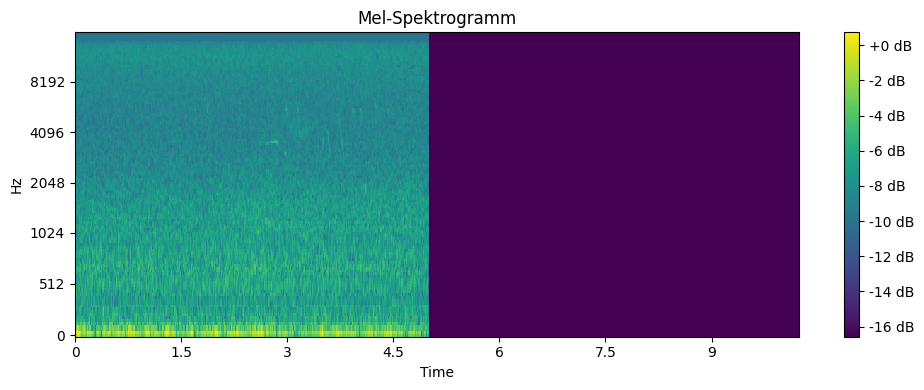

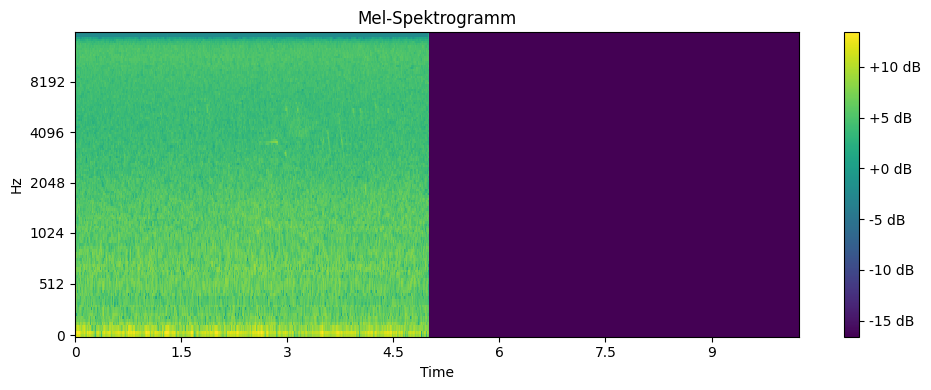

In [24]:
# show both spectrograms of a sample in test_batch1

test_batch1_example_number = 22

#eff_test_batch1_example = eff_test_batch1["input_values"][test_batch1_example_number]
eff_test_batch1_example_np = np.squeeze(eff_test_batch1["input_values"][test_batch1_example_number].numpy())
eff_test_batch1_example_true_label = torch.argmax(eff_test_batch1["labels"][test_batch1_example_number]) # Index des höchsten Werts

ast_test_batch1_example_np = np.squeeze(ast_test_batch1["input_values"][test_batch1_example_number].numpy())
ast_test_batch1_example_true_label = torch.argmax(ast_test_batch1["labels"][test_batch1_example_number]) # Index des höchsten Werts

print(f"true_label eff: {eff_test_batch1_example_true_label.item()}")
print(f"check (must be same) true_label ast: {ast_test_batch1_example_true_label.item()}")
print(f"predicted_label EfficientNet: {loaded_eff_test_batch1_prediction_label_indexes[test_batch1_example_number]}")
print(f"predicted_score EfficientNet: {loaded_eff_test_batch1_prediction_scores[test_batch1_example_number]}")
print(f"predicted_label Ast: {loaded_ast_test_batch1_prediction_label_indexes[test_batch1_example_number]}")
print(f"predicted_score Ast: {loaded_ast_test_batch1_prediction_scores[test_batch1_example_number]}")

show_spectrogram(eff_test_batch1_example_np, sr=sample_rate, hop_length=hop_length, n_fft=n_fft)
show_spectrogram(ast_test_batch1_example_np, sr=sample_rate, hop_length=hop_length, n_fft=n_fft)

# 2- XAI Vorbereitungen

Es werden 8 Samples ausgesucht.
Davon 4 Samples aus den Trainingsdaten, 4 Samples aus den Testdaten
Die 4 Samples aus train batch 1:
Sample1: Beide Modelle haben gute Vorhersagen gemacht (ID 11 )
Sample2: Nur EfficientNet hat gute Vorhersage gemacht (ID 31)
Sample3: Nur AST hat gute Vorhersage gemacht (ID 51)
Sample4: beide Modelle haben schlechte Vorhersagen gemacht (ID 17)

Die 4 Samples aus test batch 1:
...

In [25]:
# müsste ich umbauen, um einzelnes Sample zu erhalten
"""
# 8 Samples
# Die 4 Samples aus dem Eff Train Batch 1

sample_ids_train_batch1 = [11, 31, 51, 17]

sample1_eff = eff_train_batch1["input_values"][sample_ids_train_batch1[0]].unsqueeze(0)
sample1_np_eff = sample1_eff.numpy()
sample1_pred_index_eff = torch.max(loaded_eff_train_batch1_output_sigmoid, dim=1)[1][sample_ids_train_batch1[0]]

sample1_ast = train_batch_ast_1["input_values"][sample_ids_train_batch1[0]].unsqueeze(0)
sample1_np_ast = sample1_ast.numpy()
sample1_pred_index_ast = torch.max(loaded_ast_train_batch1_output_sigmoid, dim=1)[1][sample_ids_train_batch1[0]]
"""

'\n# 8 Samples\n# Die 4 Samples aus dem Eff Train Batch 1\n\nsample_ids_train_batch1 = [11, 31, 51, 17]\n\nsample1_eff = eff_train_batch1["input_values"][sample_ids_train_batch1[0]].unsqueeze(0)\nsample1_np_eff = sample1_eff.numpy()\nsample1_pred_index_eff = torch.max(loaded_eff_train_batch1_output_sigmoid, dim=1)[1][sample_ids_train_batch1[0]]\n\nsample1_ast = train_batch_ast_1["input_values"][sample_ids_train_batch1[0]].unsqueeze(0)\nsample1_np_ast = sample1_ast.numpy()\nsample1_pred_index_ast = torch.max(loaded_ast_train_batch1_output_sigmoid, dim=1)[1][sample_ids_train_batch1[0]]\n'

## 2.1 Dictionaries input_samples_train and input_samples_test

Im Dictionary input_samples_train werden für jedes ausgewählte Sample 6 Werte gespeichert:<br>
sample_eff (ein Tensor: tensor([[[[  4.5249,   3.5698,...)<br>
sample_np_eff (ein Numpy-Array: array([[[[  4.524895 ,   3.569817 ,...)<br>
sample_pred_index_eff (ein Tensor dem Label als einzigem Wert: tensor(20))<br>
sample_ast<br>
sample_np_ast<br>
sample_pred_index_ast<br>

Die ausgewählten Samples aus dem Train Batch1 sind:

Sample 16: Train Batch1, Both Models with accurate Predictions<br>
Sample 17: Train Batch1, EfficientNet accurate Predictions, AST incorrect Predictions<br>
Sample 31: Train Batch1, EfficientNet incorrect Predictions, AST accurate Predictions<br>
Sample 11: Train Batch1, Both Models with incorrect Predictions<br>


In [26]:
# Train Definiere die Sample-IDs für alle ausgewählten Samples des Train Batch
sample_ids_train_batch1 = [16, 17, 31, 11]

# Dictionary zum Speichern der Sample-Daten
input_samples_train = {} 

for sample_id in sample_ids_train_batch1:
    # Extrahiere und speichere Daten für EfficientNet
    sample_eff = eff_train_batch1["input_values"][sample_id].unsqueeze(0)
    sample_np_eff = sample_eff.numpy()
    sample_pred_index_eff = torch.max(loaded_eff_train_batch1_output_sigmoid, dim=1)[1][sample_id]
    
    # Extrahiere und speichere Daten für AST
    sample_ast = ast_train_batch1["input_values"][sample_id].unsqueeze(0)
    sample_np_ast = sample_ast.numpy()
    sample_pred_index_ast = torch.max(loaded_ast_train_batch1_output_sigmoid, dim=1)[1][sample_id]
    
    # Konstruiere den Sample-Namen
    sample_name = f"Sample{sample_id}_train_batch1"
    
    # Speichern der Daten in einem Dictionary
    input_samples_train[sample_name] = {
        "EfficientNet": {
            "sample": sample_eff,
            "sample_np": sample_np_eff,
            "pred_index": sample_pred_index_eff
        },
        "AST": {
            "sample": sample_ast,
            "sample_np": sample_np_ast,
            "pred_index": sample_pred_index_ast
        }
    }

In [27]:
# input_samples_train["Sample11_train_batch1"]["EfficientNet"]["sample"]  # tensor([[[[  4.5249,   3.5698,...

In [28]:
# input_samples_train["Sample11_train_batch1"]["EfficientNet"]["pred_index"]  # tensor(20)

In [29]:
# input_samples_train

Die ausgewählten Samples aus dem test_batch1 sind:

Sample 31: test_batch1, Both Models with accurate Predictions

Sample 22: test_batch1, EfficientNet accurate Predictions, AST incorrect Predictions

Sample 61: test_batch1, EfficientNet incorrect Predictions, AST accurate Predictions

Sample 46: test_batch1, Both Models with incorrect Predictions

In [30]:
# Test Definiere die Sample-IDs für alle ausgewählten Samples des test_batch1
sample_ids_test_batch1 = [31, 22, 61, 46]

# Dictionary zum Speichern der Sample-Daten
input_samples_test = {} 

for sample_id in sample_ids_test_batch1:
    # Extrahiere und speichere Daten für EfficientNet
    sample_eff = eff_test_batch1["input_values"][sample_id].unsqueeze(0)
    sample_np_eff = sample_eff.numpy()
    sample_pred_index_eff = torch.max(loaded_eff_test_batch1_output_sigmoid, dim=1)[1][sample_id]
    
    # Extrahiere und speichere Daten für AST
    sample_ast = ast_test_batch1["input_values"][sample_id].unsqueeze(0)
    sample_np_ast = sample_ast.numpy()
    sample_pred_index_ast = torch.max(loaded_ast_test_batch1_output_sigmoid, dim=1)[1][sample_id]
    
    # Konstruiere den Sample-Namen
    sample_name = f"Sample{sample_id}_test_batch1"
    
    # Speichern der Daten in einem Dictionary
    input_samples_test[sample_name] = {
        "EfficientNet": {
            "sample": sample_eff,
            "sample_np": sample_np_eff,
            "pred_index": sample_pred_index_eff
        },
        "AST": {
            "sample": sample_ast,
            "sample_np": sample_np_ast,
            "pred_index": sample_pred_index_ast
        }
    }

## 2.2 Vorbereitung für Visualisierungen

In [31]:
# Vorbereitung Visualisierungen

import matplotlib.pyplot as plt
from captum.attr import visualization as viz
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import FuncFormatter

# Farbkarte für die Visualisierungen
default_cmap = LinearSegmentedColormap.from_list('custom blue', 
                                             [(0, '#ffffff'), 
                                              (0.25, '#000000'), 
                                              (1, '#000000')], N=256)

# Funktion für die Berechnung der Zeitachse
def calculate_time_axis(original_np, sample_rate, hop_length):
    # calculates time axis
    return librosa.frames_to_time(np.arange(original_np.shape[1]), sr=sample_rate, hop_length=hop_length)

# Funktion für die Achsenbeschriftungen
def set_axis_labels(ax, original_np, time_axis, mel_frequencies):
    # formats time and frequency scale and sets the tick marks and labels for the x-axis and y-axis
    ax.set_xticks(np.linspace(0, original_np.shape[1] - 1, 5))
    ax.set_xticklabels(['{:.2f}s'.format(t) for t in time_axis[np.linspace(0, len(time_axis) - 1, 5, dtype=int)]])
    y_ticks = np.linspace(0, 127, 5, dtype=int)
    ax.set_yticks(y_ticks)
    ax.set_yticklabels(['{:.0f}Hz'.format(m) for m in mel_frequencies[y_ticks]])

In [32]:
# Visualisierung Muster:
"""
# Adjust the variables below:
number_of_subplots = 2
original_np = eff_train_batch1_iggscheck_np
main_title = "Vergleich IG DeepLift EfficientNet für das Sample eff_train_batch1[17]"

# create subplots
fig, axs = plt.subplots(nrows=number_of_subplots, ncols=1, figsize=(9.4, (3.75 * number_of_subplots)))
fig.suptitle(main_title, fontsize=16)

# Adjust the variables below:
subplot_nr = 1
attribution = attributions_ig_expanded_eff_iggscheck
title = 'Integrated Gradients'
viz.visualize_image_attr(attribution,
                         original_np,
                         method="heat_map",
                         sign="positive",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[subplot_nr-1]),
                         cmap=default_cmap,
                         outlier_perc=1,
                         show_colorbar=False)
axs[subplot_nr-1].invert_yaxis(); axs[subplot_nr-1].set_aspect('auto'); axs[subplot_nr-1].title.set_text(title)

# Adjust the variables below:
subplot_nr = 2
attribution = attributions_gs_expanded_eff_iggscheck
title = 'GradientSHAP'
viz.visualize_image_attr(attribution,
                         original_np,
                         method="heat_map",
                         sign="positive",
                         # sign="absolute_value",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[subplot_nr-1]),
                         cmap=default_cmap,
                         outlier_perc=1,
                         show_colorbar=False)
axs[subplot_nr-1].invert_yaxis(); axs[subplot_nr-1].set_aspect('auto'); axs[subplot_nr-1].title.set_text(title)

# set axis labels
time_axis = calculate_time_axis(original_np, sample_rate, hop_length)
for ax in axs:
    set_axis_labels(ax, original_np, time_axis, mel_frequencies)

plt.tight_layout()
plt.show()


"""

'\n# Adjust the variables below:\nnumber_of_subplots = 2\noriginal_np = eff_train_batch1_iggscheck_np\nmain_title = "Vergleich IG DeepLift EfficientNet für das Sample eff_train_batch1[17]"\n\n# create subplots\nfig, axs = plt.subplots(nrows=number_of_subplots, ncols=1, figsize=(9.4, (3.75 * number_of_subplots)))\nfig.suptitle(main_title, fontsize=16)\n\n# Adjust the variables below:\nsubplot_nr = 1\nattribution = attributions_ig_expanded_eff_iggscheck\ntitle = \'Integrated Gradients\'\nviz.visualize_image_attr(attribution,\n                         original_np,\n                         method="heat_map",\n                         sign="positive",\n                         use_pyplot=False,\n                         plt_fig_axis=(fig, axs[subplot_nr-1]),\n                         cmap=default_cmap,\n                         outlier_perc=1,\n                         show_colorbar=False)\naxs[subplot_nr-1].invert_yaxis(); axs[subplot_nr-1].set_aspect(\'auto\'); axs[subplot_nr-1].title.se

# 3- Attribution Berechnung IG, GradientSHAP, Occlusion

Welche Eingabefaktoren (wie Pixel in einem Bild oder Wörter in einem Text) tragen am meisten zu den Vorhersagen des Modells bei?

Der Integrated Gradient interpoliert bei jedem Farbkanal von jedem Pixel in n_steps (z.B. 200) zwischen der Basisfarbe (z.B. schwarz) zur Eingabe (z.B. -0.4226) und untersucht dabei die Veränderung der Vorhersage. Er berechnet für jeden dieser Schritte den Gradienten der Vorhersage in Bezug auf die den Farbkanal des Eingabepixels. 
Der "Gradient" in diesem speziellen Fall (wenn wir uns auf einen Farbkanal eines Pixels konzentrieren) könnte daher als eine Reihe von Skalaren (also Zahlen) betrachtet werden, wobei jeder Skalar die Änderungsrate der Vorhersage bezüglich einer kleinen Änderung im Wert dieses Farbkanals an jedem Interpolationsschritt darstellt. Für die Berechnung des Wertes werden die Skalare summiert und dann vom Pixelwert abgezogen. Wenn wir jedoch über das gesamte Bild und alle Farbkanäle aller Pixel sprechen, ist der Gradient ein hochdimensionaler Vektor, der alle diese partiellen Ableitungen umfasst.
Wenn die Vorhersagewahrscheinlichkeit sich stark erhöht, bekommt der Farbwert des Pixels einen hohen Wert, wenn der Einfluss klein ist, bekommt der Pixel einen niedrigen Wert. Wenn die Vorhersagewahrscheinlichkeit sich verringert, bekommt der Farbwert des Pixels einen negativen Wert.

•	Initialisierung von Integrated Gradients

    Erzeugung des „attributions_ig“-Tensors, der statt jedem Farbwert eines Pixels des input-Tenors einen Attributionswert enthält, der anzeigt, wie die Vorhersage beeinflusst wird.
    Visualisierung des attributions_ig – Tensors

     wendet die Methode attribute auf eine gegebene Eingabe (den tensor "input") an, um die Wichtigkeit (Attribution) der einzelnen 
    Eingabemerkmale für eine spezifische Zielvorhersage (target=pred_label_idx) zu bestimmen
    Es gibt dabei positive und negative Werte, und es ist keine feste Skala
    
•	Anwendung von Noise Tunnel auf Integrated Gradients

    Erzeugung des „attributions_ig_nt“-Tensors, der ein Rauschen auf die Eingabedaten einführt, und dann auf der rauschbehafteten Eingabe die Attributionswerte berechnet.
    -> klarere und möglicherweise aussagekräftigere Visualisierung
    Die Shapley-Werte sind ein Konzept aus der kooperativen Spieltheorie, benannt nach dem Nobelpreisträger Lloyd Shapley. Sie bieten eine Methode, um den Beitrag jedes Spielers in einem kooperativen Spiel zum Gesamtgewinn fair aufzuteilen
    


## 3.1 EfficientNet und AST

In [33]:
# Initialiserung Integrated Gradients, GradientSHAP, Occlusion

integrated_gradients_eff = IntegratedGradients(efficientnet_model)
integrated_gradients_ast = IntegratedGradients(ast_model)

gradient_shap_eff = GradientShap(efficientnet_model)
gradient_shap_ast = GradientShap(ast_model)

occlusion_eff = Occlusion(efficientnet_model)
occlusion_ast = Occlusion(ast_model)

In [34]:
# Iteriere durch jedes der 4 ausgewählten Samples der Traindata um attributions_data zu befüllen
# dauert sehr lange > 8700s
"""
# nur train
import pickle

attributions_data = {}

for sample_name, models_data in input_samples_train.items():
    for model_name, model_data in models_data.items():
        # Wähle das passende Modell und die XAI-Methode aus
        model = efficientnet_model if model_name == 'EfficientNet' else ast_model
        integrated_gradients = integrated_gradients_eff if model_name == 'EfficientNet' else integrated_gradients_ast
        gradient_shap = gradient_shap_eff if model_name == 'EfficientNet' else gradient_shap_ast
        occlusion = occlusion_eff if model_name == 'EfficientNet' else occlusion_ast
        
        # Berechne Integrated Gradients
        attributions_ig = integrated_gradients.attribute(
            model_data['sample'], 
            target=model_data['pred_index'], 
            n_steps=200
        )
        attributions_ig_expanded = np.expand_dims(attributions_ig.squeeze().cpu().detach().numpy(), axis=2)
        
        # Berechne GradientShap
        attributions_gs = gradient_shap.attribute(
            model_data['sample'], 
            n_samples=50,
            stdevs=0.0001,
            baselines=torch.cat([model_data['sample'] * 0, model_data['sample'] * 1]), # baseline-Verteilung besteht aus 2 Eingabebildern: input*0 (also schwarzes Bild) und input*1 (unverändertes bild)
            target=model_data['pred_index']
        )
        attributions_gs_expanded = np.expand_dims(attributions_gs.squeeze().cpu().detach().numpy(), axis=2)
        
        # Berechne Occlusion
        attributions_oc = occlusion.attribute(
            model_data['sample'], 
            target=model_data['pred_index'], 
            strides = (1, 8, 8),
            sliding_window_shapes=(1,15, 15),
            baselines=-15
        )
        attributions_oc_expanded = np.expand_dims(attributions_oc.squeeze().cpu().detach().numpy(), axis=2)

        # Speichere die Attributionsdaten im attributions_data Dictionary
        if sample_name not in attributions_data:
            attributions_data[sample_name] = {}
        if model_name not in attributions_data[sample_name]:
            attributions_data[sample_name][model_name] = {}
        
        attributions_data[sample_name][model_name]['Integrated Gradients'] = attributions_ig_expanded
        attributions_data[sample_name][model_name]['GradientSHAP'] = attributions_gs_expanded  
        attributions_data[sample_name][model_name]['Occlusion'] = attributions_oc_expanded 
        attributions_data[sample_name][model_name]['original'] = model_data['sample_np']



# Speichern des Dictionaries mit pickle
with open('attributions_data.pkl', 'wb') as pickle_file:
    pickle.dump(attributions_data, pickle_file)
"""

"\n# nur train\nimport pickle\n\nattributions_data = {}\n\nfor sample_name, models_data in input_samples_train.items():\n    for model_name, model_data in models_data.items():\n        # Wähle das passende Modell und die XAI-Methode aus\n        model = efficientnet_model if model_name == 'EfficientNet' else ast_model\n        integrated_gradients = integrated_gradients_eff if model_name == 'EfficientNet' else integrated_gradients_ast\n        gradient_shap = gradient_shap_eff if model_name == 'EfficientNet' else gradient_shap_ast\n        occlusion = occlusion_eff if model_name == 'EfficientNet' else occlusion_ast\n        \n        # Berechne Integrated Gradients\n        attributions_ig = integrated_gradients.attribute(\n            model_data['sample'], \n            target=model_data['pred_index'], \n            n_steps=200\n        )\n        attributions_ig_expanded = np.expand_dims(attributions_ig.squeeze().cpu().detach().numpy(), axis=2)\n        \n        # Berechne GradientS

In [35]:
# Berechnung der Attributionsdaten für die Testdaten
"""
attributions_data_test = {}

for sample_name, models_data in input_samples_test.items():
    for model_name, model_data in models_data.items():
        model = efficientnet_model if model_name == 'EfficientNet' else ast_model
        integrated_gradients = integrated_gradients_eff if model_name == 'EfficientNet' else integrated_gradients_ast
        gradient_shap = gradient_shap_eff if model_name == 'EfficientNet' else gradient_shap_ast
        occlusion = occlusion_eff if model_name == 'EfficientNet' else occlusion_ast

        attributions_ig = integrated_gradients.attribute(
            model_data['sample'], 
            target=model_data['pred_index'], 
            n_steps=200
        )
        attributions_ig_expanded = np.expand_dims(attributions_ig.squeeze().cpu().detach().numpy(), axis=2)

        attributions_gs = gradient_shap.attribute(
            model_data['sample'], 
            n_samples=50,
            stdevs=0.0001,
            baselines=torch.cat([model_data['sample'] * 0, model_data['sample'] * 1]),
            target=model_data['pred_index']
        )
        attributions_gs_expanded = np.expand_dims(attributions_gs.squeeze().cpu().detach().numpy(), axis=2)

        attributions_oc = occlusion.attribute(
            model_data['sample'], 
            target=model_data['pred_index'], 
            strides = (1, 8, 8),
            sliding_window_shapes=(1,15, 15),
            baselines=-15
        )
        attributions_oc_expanded = np.expand_dims(attributions_oc.squeeze().cpu().detach().numpy(), axis=2)

        # Ergänzung des Test Attributions Dictionaries
        if sample_name not in attributions_data_test:
            attributions_data_test[sample_name] = {}
        if model_name not in attributions_data_test[sample_name]:
            attributions_data_test[sample_name][model_name] = {}

        attributions_data_test[sample_name][model_name]['Integrated Gradients'] = attributions_ig_expanded
        attributions_data_test[sample_name][model_name]['GradientSHAP'] = attributions_gs_expanded  
        attributions_data_test[sample_name][model_name]['Occlusion'] = attributions_oc_expanded 
        attributions_data_test[sample_name][model_name]['original'] = model_data['sample_np']

# Optional: Speichern des Test Attributions Dictionaries
with open('attributions_data_test.pkl', 'wb') as pickle_file:
    pickle.dump(attributions_data_test, pickle_file)
"""

"\nattributions_data_test = {}\n\nfor sample_name, models_data in input_samples_test.items():\n    for model_name, model_data in models_data.items():\n        model = efficientnet_model if model_name == 'EfficientNet' else ast_model\n        integrated_gradients = integrated_gradients_eff if model_name == 'EfficientNet' else integrated_gradients_ast\n        gradient_shap = gradient_shap_eff if model_name == 'EfficientNet' else gradient_shap_ast\n        occlusion = occlusion_eff if model_name == 'EfficientNet' else occlusion_ast\n\n        attributions_ig = integrated_gradients.attribute(\n            model_data['sample'], \n            target=model_data['pred_index'], \n            n_steps=200\n        )\n        attributions_ig_expanded = np.expand_dims(attributions_ig.squeeze().cpu().detach().numpy(), axis=2)\n\n        attributions_gs = gradient_shap.attribute(\n            model_data['sample'], \n            n_samples=50,\n            stdevs=0.0001,\n            baselines=torch.c

In [36]:
"""
# Laden des existierenden Train Attributions Dictionaries
with open('attributions_data.pkl', 'rb') as pickle_file:
    attributions_data = pickle.load(pickle_file)

# Laden des Test Attributions Dictionaries
with open('attributions_data_test.pkl', 'rb') as pickle_file:
    attributions_data_test = pickle.load(pickle_file)

# Zusammenführen der Dictionaries
for sample_name, models_data in attributions_data_test.items():
    if sample_name in attributions_data:
        for model_name, data in models_data.items():
            if model_name in attributions_data[sample_name]:
                attributions_data[sample_name][model_name].update(data)
            else:
                attributions_data[sample_name][model_name] = data
    else:
        attributions_data[sample_name] = models_data

# Speichern des aktualisierten Attributions Dictionaries
with open('attributions_data.pkl', 'wb') as pickle_file:
    pickle.dump(attributions_data, pickle_file)
    """

"\n# Laden des existierenden Train Attributions Dictionaries\nwith open('attributions_data.pkl', 'rb') as pickle_file:\n    attributions_data = pickle.load(pickle_file)\n\n# Laden des Test Attributions Dictionaries\nwith open('attributions_data_test.pkl', 'rb') as pickle_file:\n    attributions_data_test = pickle.load(pickle_file)\n\n# Zusammenführen der Dictionaries\nfor sample_name, models_data in attributions_data_test.items():\n    if sample_name in attributions_data:\n        for model_name, data in models_data.items():\n            if model_name in attributions_data[sample_name]:\n                attributions_data[sample_name][model_name].update(data)\n            else:\n                attributions_data[sample_name][model_name] = data\n    else:\n        attributions_data[sample_name] = models_data\n\n# Speichern des aktualisierten Attributions Dictionaries\nwith open('attributions_data.pkl', 'wb') as pickle_file:\n    pickle.dump(attributions_data, pickle_file)\n    "

In [37]:
# laden von attributions_data

import pickle

# Öffne die .pkl-Datei im Binär-Lesemodus
with open('attributions_data.pkl', 'rb') as pickle_file:
    attributions_data = pickle.load(pickle_file)

# print(attributions_data)
# {'Sample11_train_batch1': {'EfficientNet': {'Integrated Gradients': array([[[ 4.65891644e-05], [ 1.53849757e-04],...
# 'GradientSHAP': array([[[ 1.4956942e-05],

In [38]:
# attributions_data['Sample11_train_batch1']['EfficientNet']['Integrated Gradients']  # array([[[ 4.65891644e-05],...

In [39]:
# attributions_data['Sample11_train_batch1']['EfficientNet']['GradientSHAP']  # array([[[ 1.4956942e-05],..

In [40]:
#attributions_data['Sample11_train_batch1']['EfficientNet']['Occlusion']  # array([[[-0.00311279],..

In [41]:
# attributions_data['Sample11_train_batch1']['EfficientNet']

In [42]:
#attributions_data

In [43]:
keys = attributions_data.keys()
print(keys)

dict_keys(['Sample16_train_batch1', 'Sample17_train_batch1', 'Sample31_train_batch1', 'Sample11_train_batch1', 'Sample31_test_batch1', 'Sample22_test_batch1', 'Sample61_test_batch1', 'Sample46_test_batch1'])


## 3.2 Wav2Vec2

In [44]:
w2v2_sample_a = w2v2_train_batch1['input_values'][0].unsqueeze(0)
w2v2_sample_a_np = w2v2_sample_a.numpy()
w2v2_sample_a_pred_index = torch.max(loaded_w2v2_train_batch1_output_sigmoid, dim=1)[1][0]
print(w2v2_sample_a)
print(w2v2_sample_a_np)
print(w2v2_sample_a_pred_index)

tensor([[[-0.2066,  0.0197,  0.3397,  ..., -0.2177,  0.1022,  0.2141]]])
[[[-0.20664105  0.01967174  0.3396619  ... -0.21772091  0.10223806
    0.21414882]]]
tensor(4)


In [45]:
print(w2v2_sample_a)


tensor([[[-0.2066,  0.0197,  0.3397,  ..., -0.2177,  0.1022,  0.2141]]])


### 3.3 Versuch: Waveform-Tensoren von wav2vec2 in Spektrogramme umwandeln und dann Integrated Gradients darauf anwenden

In [46]:
"""
w2v2_sample_a = w2v2_train_batch1['input_values'][0].unsqueeze(0)
w2v2_sample_a_np = w2v2_sample_a.numpy()
w2v2_sample_a_pred_index = torch.max(loaded_w2v2_train_batch1_output_sigmoid, dim=1)[1][0]
print(w2v2_sample_a)
print(w2v2_sample_a_np)
print(w2v2_sample_a_pred_index)
"""

tensor([[[-0.2066,  0.0197,  0.3397,  ..., -0.2177,  0.1022,  0.2141]]])
[[[-0.20664105  0.01967174  0.3396619  ... -0.21772091  0.10223806
    0.21414882]]]
tensor(4)


In [47]:
"""
# Umwandlung der Waveform in ein Spektrogramm
w2v2_sample_a_spectrogram = torchaudio.transforms.MelSpectrogram()(w2v2_sample_a)
w2v2_sample_a_spectrogram_np = w2v2_sample_a_spectrogram.detach().numpy()
w2v2_sample_a_spectrogram
"""

NameError: name 'torchaudio' is not defined

In [ ]:
"""
# Normalisierung des Spektrogramms
mean = w2v2_sample_a_spectrogram.mean()
std = w2v2_sample_a_spectrogram.std()
w2v2_sample_a_spectrogram_normalized = (w2v2_sample_a_spectrogram - mean) / std
w2v2_sample_a_spectrogram_normalized
"""

In [48]:
# Normalisierung der Eingabewaveform
w2v2_sample_a_normalized = (w2v2_sample_a - w2v2_sample_a.mean()) / w2v2_sample_a.std()

In [49]:
w2v2_sample_a_normalized

tensor([[[-0.2096,  0.0200,  0.3445,  ..., -0.2208,  0.1037,  0.2172]]])

In [50]:
# Baseline definieren
# Eine Null-Baseline verwenden
w2v2_baseline = torch.zeros_like(w2v2_sample_a_normalized)

In [51]:
# Initialisieren von Integrated Gradients
integrated_gradients_w = IntegratedGradients(wav2vec2_model)

# Berechnen der Attributionswerte
attributions_w = integrated_gradients_w.attribute(
    inputs=w2v2_sample_a_normalized,
    baselines=w2v2_baseline,
    target=w2v2_sample_a_pred_index,
    n_steps=200
)

# Konvertieren der Attributionswerte in ein NumPy-Array
attributions_w_np = attributions_w.squeeze().cpu().detach().numpy()

# Überprüfen der Form der Attributionswerte
print("Shape of attributions tensor:", attributions_w.shape)
print("Shape of attributions_w tensor:", attributions_w_np.shape)

Shape of attributions tensor: torch.Size([1, 1, 80000])
Shape of attributions_w tensor: (80000,)


In [52]:
attributions_w_np

array([-0.,  0.,  0., ..., -0.,  0.,  0.])

Das Array enthält nur Nullen.
Das Array enthält 0 Nicht-Null-Elemente.


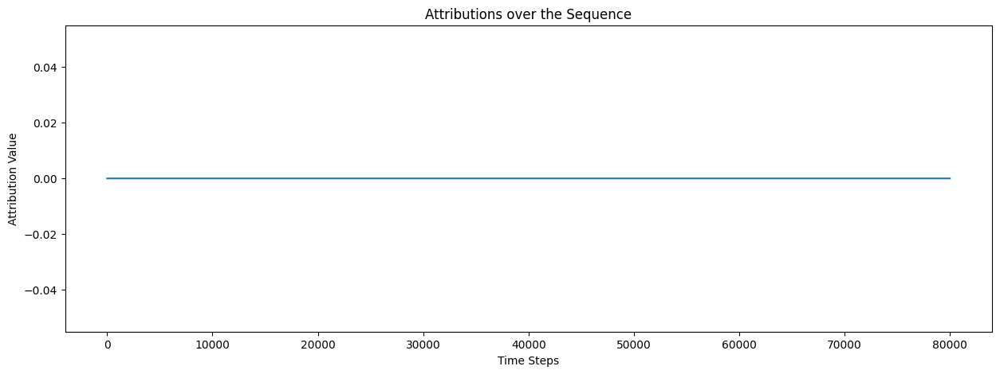

In [53]:
# Überprüfen, ob das Array nur Nullen enthält
if np.all(attributions_w_np == 0):
    print("Das Array enthält nur Nullen.")
else:
    print("Das Array enthält nicht nur Nullen.")

# Anzahl der Nicht-Null-Elemente
non_zero_count = np.count_nonzero(attributions_w_np)
print(f"Das Array enthält {non_zero_count} Nicht-Null-Elemente.")

# Visualisierung der Attributionswerte als Liniendiagramm
plt.figure(figsize=(15, 5))
plt.plot(attributions_w_np.flatten())
plt.title('Attributions over the Sequence')
plt.xlabel('Time Steps')
plt.ylabel('Attribution Value')
plt.show()

In [54]:
IntegratedGradients?


Init signature:
IntegratedGradients(
    forward_func: Callable,
    multiply_by_inputs: bool = True,
) -> None
Docstring:     
Integrated Gradients is an axiomatic model interpretability algorithm that
assigns an importance score to each input feature by approximating the
integral of gradients of the model's output with respect to the inputs
along the path (straight line) from given baselines / references to inputs.

Baselines can be provided as input arguments to attribute method.
To approximate the integral we can choose to use either a variant of
Riemann sum or Gauss-Legendre quadrature rule.

More details regarding the integrated gradients method can be found in the
original paper:
https://arxiv.org/abs/1703.01365
Init docstring:
Args:

    forward_func (Callable): The forward function of the model or any
            modification of it
    multiply_by_inputs (bool, optional): Indicates whether to factor
            model inputs' multiplier in the final attribution scores.
        

In [55]:
"""
# dauert

# Beispiel für eine einfache Normalisierung der Eingabedaten
w2v2_sample_a_normalized = (w2v2_sample_a - w2v2_sample_a.mean()) / w2v2_sample_a.std()

# Ensure the prediction index is a scalar
w2v2_sample_a_pred_index_scalar = w2v2_sample_a_pred_index.item()

# Define a baseline with the same shape as w2v2_sample_a
w2v2_baseline = torch.zeros_like(w2v2_sample_a)

# Probieren Sie eine andere Baseline aus, z.B. ein konstantes Tensor mit dem Mittelwert der Eingabewerte
w2v2_baseline_mean = torch.full_like(w2v2_sample_a_normalized, w2v2_sample_a_normalized.mean())

integrated_gradients_w2v2 = IntegratedGradients(wav2vec2_model)

attributions_w2v2 = integrated_gradients_w2v2.attribute(
    inputs=w2v2_sample_a_normalized, 
    baselines=w2v2_baseline_mean,
    target=w2v2_sample_a_pred_index_scalar, 
    n_steps=200
)
attributions_w2v2_np = attributions_w2v2.squeeze().cpu().detach().numpy()  # Shape of attributions tensor: torch.Size([1, 1, 80000])
"""

'\n# dauert\n\n# Beispiel für eine einfache Normalisierung der Eingabedaten\nw2v2_sample_a_normalized = (w2v2_sample_a - w2v2_sample_a.mean()) / w2v2_sample_a.std()\n\n# Ensure the prediction index is a scalar\nw2v2_sample_a_pred_index_scalar = w2v2_sample_a_pred_index.item()\n\n# Define a baseline with the same shape as w2v2_sample_a\nw2v2_baseline = torch.zeros_like(w2v2_sample_a)\n\n# Probieren Sie eine andere Baseline aus, z.B. ein konstantes Tensor mit dem Mittelwert der Eingabewerte\nw2v2_baseline_mean = torch.full_like(w2v2_sample_a_normalized, w2v2_sample_a_normalized.mean())\n\nintegrated_gradients_w2v2 = IntegratedGradients(wav2vec2_model)\n\nattributions_w2v2 = integrated_gradients_w2v2.attribute(\n    inputs=w2v2_sample_a_normalized, \n    baselines=w2v2_baseline_mean,\n    target=w2v2_sample_a_pred_index_scalar, \n    n_steps=200\n)\nattributions_w2v2_np = attributions_w2v2.squeeze().cpu().detach().numpy()  # Shape of attributions tensor: torch.Size([1, 1, 80000])\n'

In [56]:
import numpy as np
import torch
from captum.attr import IntegratedGradients
import matplotlib.pyplot as plt

# Beispiel für eine einfache Normalisierung der Eingabedaten
w2v2_sample_a_normalized = (w2v2_sample_a - w2v2_sample_a.mean()) / w2v2_sample_a.std()

# Ensure the prediction index is a scalar
w2v2_sample_a_pred_index_scalar = w2v2_sample_a_pred_index.item()

# Define a baseline with the same shape as w2v2_sample_a
w2v2_baseline = torch.zeros_like(w2v2_sample_a)

# Probieren Sie eine andere Baseline aus, z.B. ein konstantes Tensor mit dem Mittelwert der Eingabewerte
w2v2_baseline_mean = torch.full_like(w2v2_sample_a_normalized, w2v2_sample_a_normalized.mean().item())

integrated_gradients_w2v2 = IntegratedGradients(wav2vec2_model)

attributions_w2v2 = integrated_gradients_w2v2.attribute(
    inputs=w2v2_sample_a_normalized, 
    baselines=w2v2_baseline_mean,
    target=w2v2_sample_a_pred_index_scalar, 
    n_steps=200
)

attributions_w2v2_np = attributions_w2v2.squeeze().cpu().detach().numpy()  # Shape of attributions tensor: torch.Size([1, 1, 80000])


In [57]:
attributions_w2v2_np

array([-0.,  0.,  0., ..., -0.,  0.,  0.])

In [58]:
# Überprüfen, ob alle Elemente null sind
if np.all(attributions_w2v2_np == 0):
    print("Das Array enthält nur Nullen.")
else:
    print("Das Array enthält nicht nur Nullen.")

Das Array enthält nur Nullen.


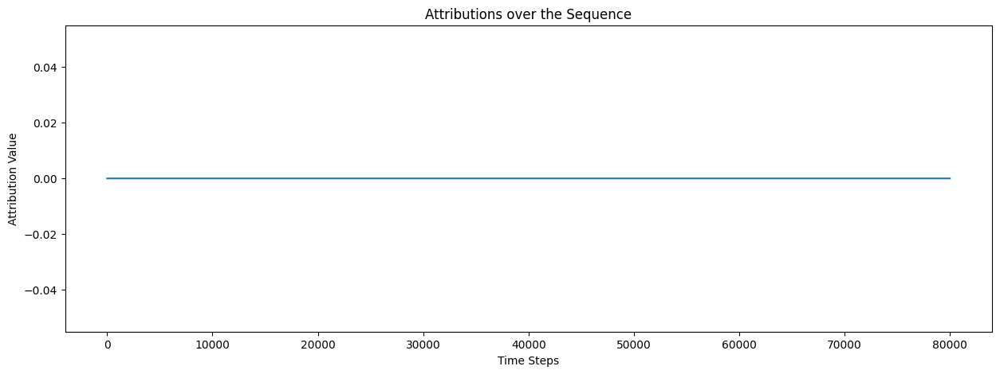

In [59]:
import matplotlib.pyplot as plt

# Assuming attributions_w2v2_np is your attributions numpy array
plt.figure(figsize=(15, 5))
plt.plot(attributions_w2v2_np.flatten())
plt.title('Attributions over the Sequence')
plt.xlabel('Time Steps')
plt.ylabel('Attribution Value')
plt.show()

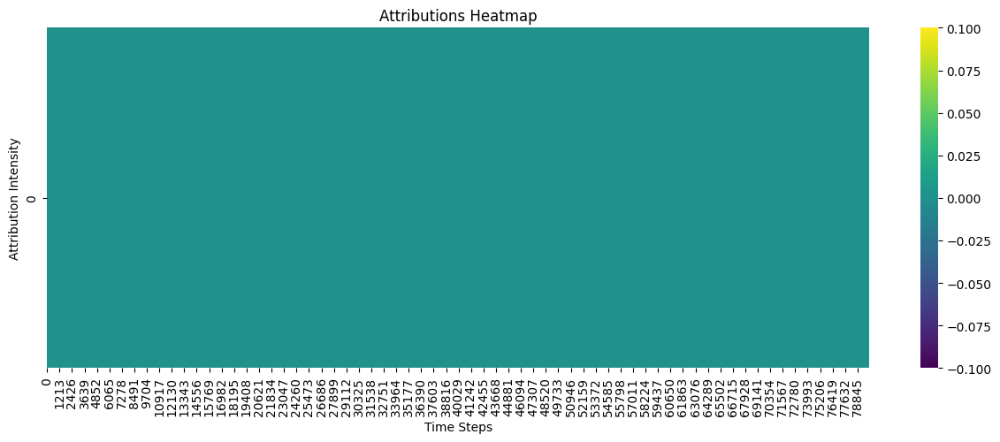

In [60]:
import seaborn as sns
import matplotlib.pyplot as plt

# Reshape the attributions if necessary to match the desired dimensions for heatmap
# For example, if attributions_w2v2_np is (1, 1, 80000), you might want to remove single-dimensional entries:
attributions_w2v2_np = attributions_w2v2_np.squeeze()

plt.figure(figsize=(15, 5))
sns.heatmap(attributions_w2v2_np[np.newaxis, :], cmap='viridis', cbar=True)
plt.title('Attributions Heatmap')
plt.xlabel('Time Steps')
plt.ylabel('Attribution Intensity')
plt.show()

In [61]:
# Überprüfen Sie die Modellvorhersage für die Eingabe
model_output = wav2vec2_model(w2v2_sample_a)
print("Model output:", model_output)

# Stellen Sie sicher, dass der Modelloutput nicht leer ist


Model output: tensor([[-6.8988, -3.2535, -4.2901, -3.9151,  3.2851, -4.3959, -3.1283, -4.2185,
         -4.8702, -6.0342, -3.8688, -3.2994, -3.3784, -2.7539, -4.0904, -4.2221,
         -3.1672, -3.9341, -3.6850, -3.1982, -3.8526]],
       grad_fn=<AddmmBackward0>)


In [62]:
# Überprüfen Sie die Gradientenberechnung
w2v2_sample_a.requires_grad = True
output = wav2vec2_model(w2v2_sample_a)
loss = output[0, w2v2_sample_a_pred_index_scalar]  # Annahme: Output ist ein Tensor mit mehreren Klassen
loss.backward()
gradients = w2v2_sample_a.grad
print("Gradients:", gradients)

Gradients: tensor([[[ 9.2276e+29,  3.3424e+29,  9.0792e+29,  ..., -4.6130e+26,
          -5.1841e+26, -4.9872e+26]]])


# 4 - Experimente

## 4.1 Warum sehen die GradientSHAP Visualisierungen genau gleich aus wie die Integrated Gradient Visualisierungen?

Sample17_train_batch1 EfficientNet


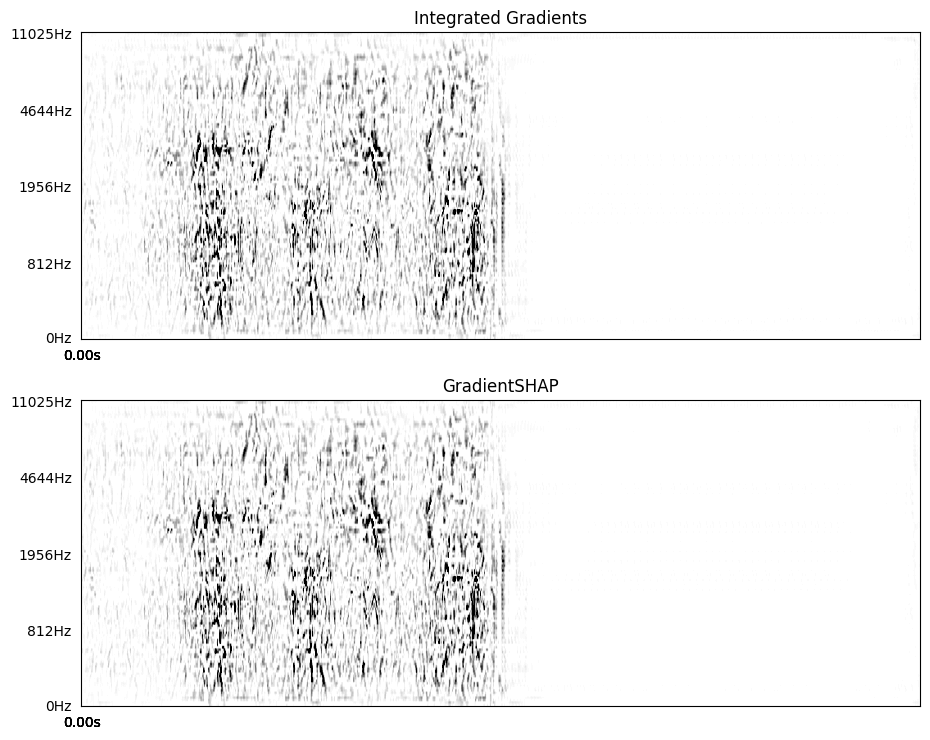

In [63]:
# Visualisierung nur IG und GradientSHAP:
# Starke Ähnlichkeit bei gleichen Visualisierungseinstellungen. Hier beide sign="positive", outlier_perc=1

import matplotlib.pyplot as plt
from captum.attr import visualization as viz
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import FuncFormatter

sample_key = 'Sample17_train_batch1'
model_key = 'EfficientNet'
sample_model = attributions_data[sample_key][model_key]
print(sample_key, model_key)

# Erstellung von Subplots
# Breite und Höhe von Heatmap und Originalbild ändern sich, wenn figsize verändert wird 
fig, axs = plt.subplots(2, 1, figsize=(9.4, 7.5))  

# Berechnen der Zeitachse für das Spektrogramm
time_axis = librosa.frames_to_time(np.arange(sample_model['original'].shape[1]), sr=32000, hop_length=128)

# Integrated Gradients Attributionswerte (Heatmap)
viz.visualize_image_attr(sample_model['Integrated Gradients'],
                         sample_model['original'].squeeze(),
                         method="heat_map",
                         sign="positive",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[0]),
                         cmap=default_cmap,
                         outlier_perc=1,
                         show_colorbar=False)
axs[0].invert_yaxis() 
axs[0].title.set_text('Integrated Gradients')
axs[0].set_aspect('auto')


# GradientSHAP Attributionswerte (Heatmap)
viz.visualize_image_attr(sample_model['GradientSHAP'],
                         sample_model['original'].squeeze(),
                         method="heat_map",
                         sign="positive",
                         # sign="absolute_value",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[1]),
                         cmap=default_cmap,
                         outlier_perc=1,
                         show_colorbar=False)
axs[1].invert_yaxis() 
axs[1].title.set_text('GradientSHAP')
axs[1].set_aspect('auto')


# Setze die Achsenbeschriftungen für beide Grafiken
for ax in axs:
    # Zeitachse skalieren und formatieren
    ax.set_xticks(np.linspace(0, sample_model['original'].shape[1] - 1, 5))
    ax.set_xticklabels(['{:.2f}s'.format(t) for t in time_axis[np.linspace(0, len(time_axis) - 1, 5, dtype=int)]])
    # Frequenzachse skalieren und formatieren
    y_ticks = np.linspace(0, 127, 5, dtype=int)  # gleichmäßige Verteilung über die Y-Achse
    ax.set_yticks(y_ticks)
    ax.set_yticklabels(['{:.0f}Hz'.format(m) for m in mel_frequencies[y_ticks]])

plt.tight_layout()
plt.show()

### Überprüfung ob IG und GS korrekt berechnet wurden mit einzelner attributions Berechnung nur eff

In [64]:
# Sample aus dem train_batch1 nehmen

sample_id = 17

eff_train_batch1_iggscheck = eff_train_batch1["input_values"][sample_id].unsqueeze(0)
eff_train_batch1_iggscheck_np = np.squeeze(eff_train_batch1["input_values"][sample_id].numpy())
eff_train_batch1_iggscheck_predindex = torch.max(loaded_eff_train_batch1_output_sigmoid, dim=1)[1][sample_id]


In [65]:
"""
# Einzelne Berechnung der Attributions IG und GS für ein einzelnes Sample
# Baselines und Hyperparameter aus Captum Tutorial
# dauert etwas

# Instanzen von IG und GS initialisieren
integrated_gradients_eff_iggscheck = IntegratedGradients(efficientnet_model)
gradient_shap_eff_iggscheck = GradientShap(efficientnet_model)

# Berechne Integrated Gradients
attributions_ig_eff_iggscheck = integrated_gradients_eff_iggscheck.attribute(
    eff_train_batch1_iggscheck, 
    target=eff_train_batch1_iggscheck_predindex, 
    n_steps=200
)
attributions_ig_expanded_eff_iggscheck = np.expand_dims(attributions_ig_eff_iggscheck.squeeze().cpu().detach().numpy(), axis=2)

# Berechne GradientShap
attributions_gs_eff_iggscheck = gradient_shap_eff_iggscheck.attribute(
    eff_train_batch1_iggscheck, 
    n_samples=50,
    stdevs=0.0001,
    baselines=torch.cat([eff_train_batch1_iggscheck * 0, eff_train_batch1_iggscheck * 1]), # baseline-Verteilung besteht aus 2 Eingabebildern: input*0 (also schwarzes Bild) und input*1 (unverändertes bild)
    target=eff_train_batch1_iggscheck_predindex
)
attributions_gs_expanded_eff_iggscheck = np.expand_dims(attributions_gs_eff_iggscheck.squeeze().cpu().detach().numpy(), axis=2)

# Fazit. erzeugt 2 beinahe identische attributions
"""

'\n# Einzelne Berechnung der Attributions IG und GS für ein einzelnes Sample\n# Baselines und Hyperparameter aus Captum Tutorial\n# dauert etwas\n\n# Instanzen von IG und GS initialisieren\nintegrated_gradients_eff_iggscheck = IntegratedGradients(efficientnet_model)\ngradient_shap_eff_iggscheck = GradientShap(efficientnet_model)\n\n# Berechne Integrated Gradients\nattributions_ig_eff_iggscheck = integrated_gradients_eff_iggscheck.attribute(\n    eff_train_batch1_iggscheck, \n    target=eff_train_batch1_iggscheck_predindex, \n    n_steps=200\n)\nattributions_ig_expanded_eff_iggscheck = np.expand_dims(attributions_ig_eff_iggscheck.squeeze().cpu().detach().numpy(), axis=2)\n\n# Berechne GradientShap\nattributions_gs_eff_iggscheck = gradient_shap_eff_iggscheck.attribute(\n    eff_train_batch1_iggscheck, \n    n_samples=50,\n    stdevs=0.0001,\n    baselines=torch.cat([eff_train_batch1_iggscheck * 0, eff_train_batch1_iggscheck * 1]), # baseline-Verteilung besteht aus 2 Eingabebildern: input

In [66]:
"""
# Visualisierung der Kontrolle nur IG und GradientSHAP:

import matplotlib.pyplot as plt
from captum.attr import visualization as viz
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import FuncFormatter

# Erstellung von Subplots
# Breite und Höhe von Heatmap und Originalbild ändern sich, wenn figsize verändert wird 
fig, axs = plt.subplots(2, 1, figsize=(9.4, 7.5)) 

# Berechnen der Zeitachse für das Spektrogramm
time_axis = librosa.frames_to_time(np.arange(eff_train_batch1_iggscheck_np.shape[1]), sr=sample_rate, hop_length=hop_length)

# Integrated Gradients Attributionswerte (Heatmap)
viz.visualize_image_attr(attributions_ig_expanded_eff_iggscheck,
                         eff_train_batch1_iggscheck_np,
                         method="heat_map",
                         sign="positive",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[0]),
                         cmap=default_cmap,
                         outlier_perc=1,
                         show_colorbar=False)
axs[0].invert_yaxis() 
axs[0].title.set_text('Integrated Gradients')
axs[0].set_aspect('auto')

# GradientSHAP Attributionswerte (Heatmap)
viz.visualize_image_attr(attributions_gs_expanded_eff_iggscheck,
                         eff_train_batch1_iggscheck_np,
                         method="heat_map",
                         sign="positive",
                         # sign="absolute_value",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[1]),
                         cmap=default_cmap,
                         outlier_perc=1,
                         show_colorbar=False)
axs[1].invert_yaxis() 
axs[1].title.set_text('GradientSHAP')
axs[1].set_aspect('auto')

# Setze die Achsenbeschriftungen für beide Grafiken
for ax in axs:
    # Zeitachse skalieren und formatieren
    ax.set_xticks(np.linspace(0, eff_train_batch1_iggscheck_np.shape[1] - 1, 5))
    ax.set_xticklabels(['{:.2f}s'.format(t) for t in time_axis[np.linspace(0, len(time_axis) - 1, 5, dtype=int)]])
    # Frequenzachse skalieren und formatieren
    y_ticks = np.linspace(0, 127, 5, dtype=int)  # gleichmäßige Verteilung über die Y-Achse
    ax.set_yticks(y_ticks)
    ax.set_yticklabels(['{:.0f}Hz'.format(m) for m in mel_frequencies[y_ticks]])

plt.tight_layout()
plt.show()
"""

'\n# Visualisierung der Kontrolle nur IG und GradientSHAP:\n\nimport matplotlib.pyplot as plt\nfrom captum.attr import visualization as viz\nfrom matplotlib.colors import LinearSegmentedColormap\nfrom mpl_toolkits.axes_grid1 import make_axes_locatable\nfrom matplotlib.ticker import FuncFormatter\n\n# Erstellung von Subplots\n# Breite und Höhe von Heatmap und Originalbild ändern sich, wenn figsize verändert wird \nfig, axs = plt.subplots(2, 1, figsize=(9.4, 7.5)) \n\n# Berechnen der Zeitachse für das Spektrogramm\ntime_axis = librosa.frames_to_time(np.arange(eff_train_batch1_iggscheck_np.shape[1]), sr=sample_rate, hop_length=hop_length)\n\n# Integrated Gradients Attributionswerte (Heatmap)\nviz.visualize_image_attr(attributions_ig_expanded_eff_iggscheck,\n                         eff_train_batch1_iggscheck_np,\n                         method="heat_map",\n                         sign="positive",\n                         use_pyplot=False,\n                         plt_fig_axis=(fig, ax

Möglichkeiten, um unterschiedlichere Einsichten aus IG und GS zu erhalten:

Variieren der Baselines

Anpassung der Hyperparameter: bei IG: n_steps, bei GS: n_samples, stdevs 

Target Labels verändern


In [67]:
"""
# Experiment Hyperparameter und Baseline Einzelne Berechnung der Attributions IG und GS für ein einzelnes Sample
# dauert etwas

# Instanzen von IG und GS initialisieren
integrated_gradients_eff_iggscheck = IntegratedGradients(efficientnet_model)
gradient_shap_eff_iggscheck = GradientShap(efficientnet_model)

# Berechne Integrated Gradients
attributions_ig_eff_iggscheck = integrated_gradients_eff_iggscheck.attribute(
    eff_train_batch1_iggscheck, 
    target=eff_train_batch1_iggscheck_predindex, 
    n_steps=300 # Erhöht von 200 auf 300
)
attributions_ig_expanded_eff_iggscheck = np.expand_dims(attributions_ig_eff_iggscheck.squeeze().cpu().detach().numpy(), axis=2)

# Berechne GradientShap
attributions_gs_eff_iggscheck = gradient_shap_eff_iggscheck.attribute(
    eff_train_batch1_iggscheck, 
    n_samples=100,  # Erhöht von 50 auf 100
    stdevs=0.01,    # Erhöht von 0.0001 auf 0.01
    baselines=torch.randn_like(eff_train_batch1_iggscheck) * 0.5,  # Zufälliges Rauschen als Baseline
    target=eff_train_batch1_iggscheck_predindex
)
attributions_gs_expanded_eff_iggscheck = np.expand_dims(attributions_gs_eff_iggscheck.squeeze().cpu().detach().numpy(), axis=2)

# Fazit: auch fast kein Unterschied
"""

'\n# Experiment Hyperparameter und Baseline Einzelne Berechnung der Attributions IG und GS für ein einzelnes Sample\n# dauert etwas\n\n# Instanzen von IG und GS initialisieren\nintegrated_gradients_eff_iggscheck = IntegratedGradients(efficientnet_model)\ngradient_shap_eff_iggscheck = GradientShap(efficientnet_model)\n\n# Berechne Integrated Gradients\nattributions_ig_eff_iggscheck = integrated_gradients_eff_iggscheck.attribute(\n    eff_train_batch1_iggscheck, \n    target=eff_train_batch1_iggscheck_predindex, \n    n_steps=300 # Erhöht von 200 auf 300\n)\nattributions_ig_expanded_eff_iggscheck = np.expand_dims(attributions_ig_eff_iggscheck.squeeze().cpu().detach().numpy(), axis=2)\n\n# Berechne GradientShap\nattributions_gs_eff_iggscheck = gradient_shap_eff_iggscheck.attribute(\n    eff_train_batch1_iggscheck, \n    n_samples=100,  # Erhöht von 50 auf 100\n    stdevs=0.01,    # Erhöht von 0.0001 auf 0.01\n    baselines=torch.randn_like(eff_train_batch1_iggscheck) * 0.5,  # Zufälliges 

In [68]:

# GradientShap.attribute?


In [69]:
"""
# Visualisierung der Kontrolle nur IG und GradientSHAP:

# Adjust the variables below:
number_of_subplots = 2
original_np = eff_train_batch1_iggscheck_np

# create subplots
fig, axs = plt.subplots(nrows=number_of_subplots, ncols=1, figsize=(9.4, (3.75 * number_of_subplots)))

# Adjust the variables below:
subplot_nr = 1
attribution = attributions_ig_expanded_eff_iggscheck
title = 'Integrated Gradients'
viz.visualize_image_attr(attribution,
                         original_np,
                         method="heat_map",
                         sign="positive",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[subplot_nr-1]),
                         cmap=default_cmap,
                         outlier_perc=1,
                         show_colorbar=False)
axs[subplot_nr-1].invert_yaxis(); axs[subplot_nr-1].set_aspect('auto'); axs[subplot_nr-1].title.set_text(title)

# Adjust the variables below:
subplot_nr = 2
attribution = attributions_gs_expanded_eff_iggscheck
title = 'GradientSHAP'
viz.visualize_image_attr(attribution,
                         original_np,
                         method="heat_map",
                         sign="positive",
                         # sign="absolute_value",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[subplot_nr-1]),
                         cmap=default_cmap,
                         outlier_perc=1,
                         show_colorbar=False)
axs[subplot_nr-1].invert_yaxis(); axs[subplot_nr-1].set_aspect('auto'); axs[subplot_nr-1].title.set_text(title)

# set axis labels
time_axis = calculate_time_axis(original_np, sample_rate, hop_length)
for ax in axs:
    set_axis_labels(ax, original_np, time_axis, mel_frequencies)

plt.tight_layout()
plt.show()
"""

'\n# Visualisierung der Kontrolle nur IG und GradientSHAP:\n\n# Adjust the variables below:\nnumber_of_subplots = 2\noriginal_np = eff_train_batch1_iggscheck_np\n\n# create subplots\nfig, axs = plt.subplots(nrows=number_of_subplots, ncols=1, figsize=(9.4, (3.75 * number_of_subplots)))\n\n# Adjust the variables below:\nsubplot_nr = 1\nattribution = attributions_ig_expanded_eff_iggscheck\ntitle = \'Integrated Gradients\'\nviz.visualize_image_attr(attribution,\n                         original_np,\n                         method="heat_map",\n                         sign="positive",\n                         use_pyplot=False,\n                         plt_fig_axis=(fig, axs[subplot_nr-1]),\n                         cmap=default_cmap,\n                         outlier_perc=1,\n                         show_colorbar=False)\naxs[subplot_nr-1].invert_yaxis(); axs[subplot_nr-1].set_aspect(\'auto\'); axs[subplot_nr-1].title.set_text(title)\n\n# Adjust the variables below:\nsubplot_nr = 2\natt

### Fazit IG - GS:

Ist auch bei erneuter Erstellung an einem Einzelbeispiel von IG und GS bei gleicher Visualisierungeinstellung beinahe gleich.
Das Schwanenbild im Captum Tutorial hat bei gleichen Visualisierungseinstellungen auch beinahe identische Visualisierungen von IG und GS.
Berechnung erfolgt trotzdem unterschiedlich.

## 4.2 Vergleich der beiden Originalbilder Eff und AST

Originalbilder mancher Samples recht ähnlich:
Sample11_train_batch1
Sample16_train_batch1

Klare Unterschiede z.B. bei 
Sample31_train_batch1

Sample31_train_batch1


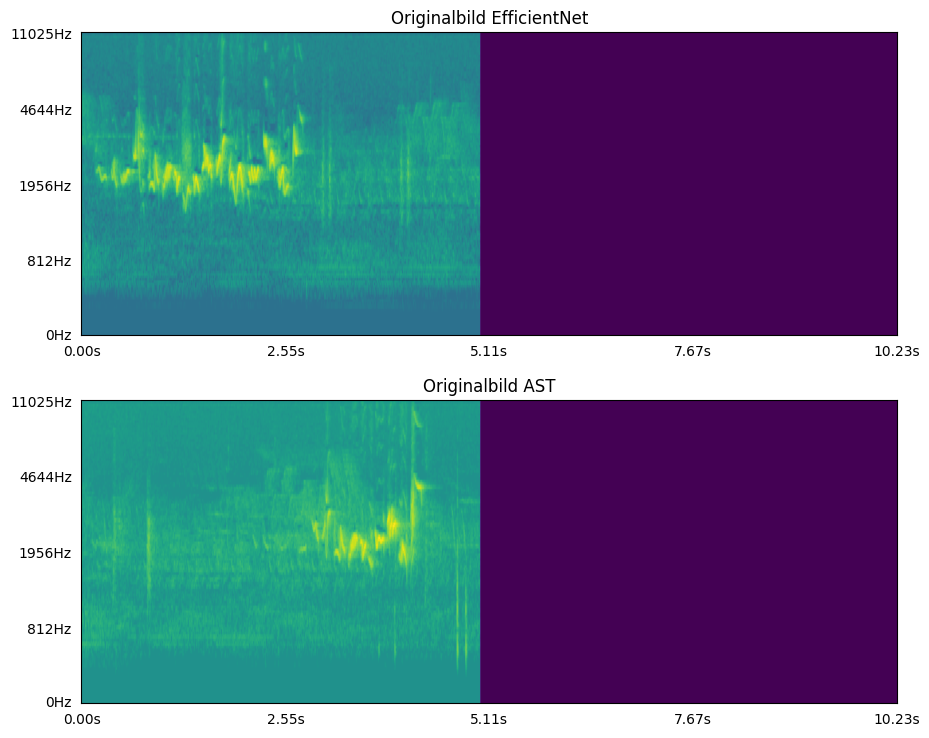

In [70]:
# Vergleich der beiden Originalbilder Eff und AST:

import matplotlib.pyplot as plt
from captum.attr import visualization as viz
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import FuncFormatter

sample_key = 'Sample31_train_batch1'
sample = attributions_data[sample_key]
print(sample_key)



# Erstellung von Subplots
# Breite und Höhe von Heatmap und Originalbild ändern sich, wenn figsize verändert wird 
fig, axs = plt.subplots(2, 1, figsize=(9.4, 7.5))  

# Berechnen der Zeitachse für das Spektrogramm
time_axis = librosa.frames_to_time(np.arange(sample_model['original'].squeeze().shape[1]), sr=sample_rate, hop_length=hop_length)


# Originalbild EfficientNet
viz.visualize_image_attr(None,
                         sample['EfficientNet']['original'].squeeze(),
                         method="original_image",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[0]),
                         cmap=default_cmap,
                         show_colorbar=True)
axs[0].invert_yaxis() 
axs[0].title.set_text('Originalbild EfficientNet')
axs[0].set_aspect('auto')

# Originalbild AST
viz.visualize_image_attr(None,
                         sample['AST']['original'].squeeze(),
                         method="original_image",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[1]),
                         cmap=default_cmap,
                         show_colorbar=True)
axs[1].invert_yaxis() 
axs[1].title.set_text('Originalbild AST')
axs[1].set_aspect('auto')


# Setze die Achsenbeschriftungen für alle Grafiken
for ax in axs:
    # Zeitachse skalieren und formatieren
    ax.set_xticks(np.linspace(0, sample_model['original'].squeeze().shape[1] - 1, 5))
    ax.set_xticklabels(['{:.2f}s'.format(t) for t in time_axis[np.linspace(0, len(time_axis) - 1, 5, dtype=int)]])
    # Frequenzachse skalieren und formatieren
    y_ticks = np.linspace(0, 127, 5, dtype=int)  # gleichmäßige Verteilung über die Y-Achse
    ax.set_yticks(y_ticks)
    ax.set_yticklabels(['{:.0f}Hz'.format(m) for m in mel_frequencies[y_ticks]])

plt.tight_layout()
plt.show()

## 4.3 Überprüfung: warum werden manche der Originalbilder von EffifientNet nicht korrekt dargestellt?

Sample22_test_batch1


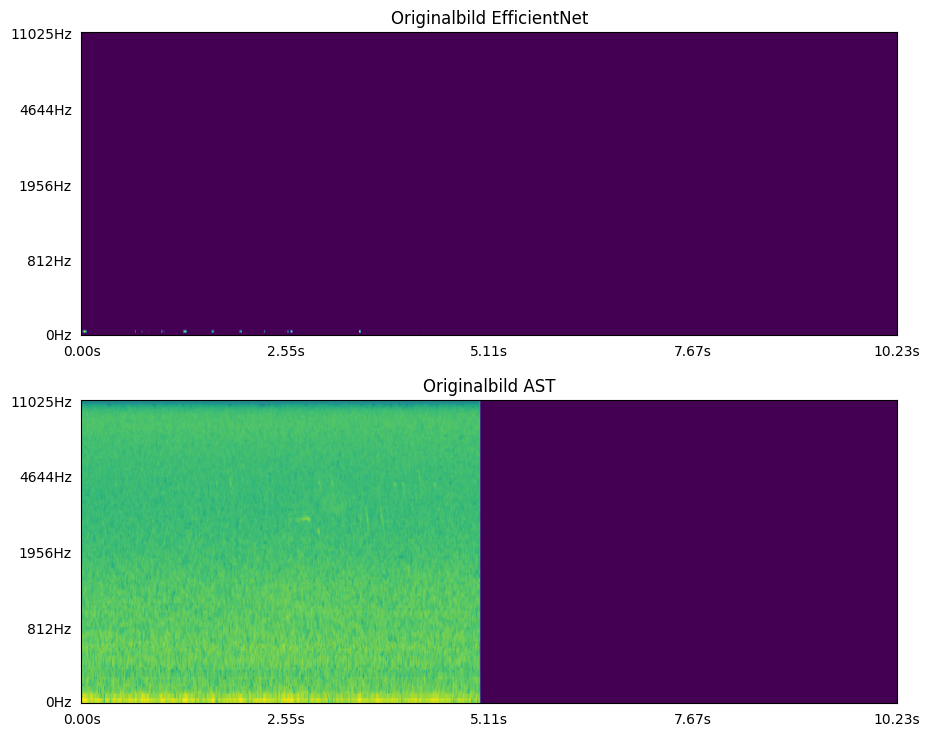

In [71]:
# warum sind 2 der Originalbilder Eff in der matrix ganz unten falsch?:

import matplotlib.pyplot as plt
from captum.attr import visualization as viz
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import FuncFormatter

sample_key = 'Sample22_test_batch1'
sample = attributions_data[sample_key]
print(sample_key)



# Erstellung von Subplots
# Breite und Höhe von Heatmap und Originalbild ändern sich, wenn figsize verändert wird 
fig, axs = plt.subplots(2, 1, figsize=(9.4, 7.5))  

# Berechnen der Zeitachse für das Spektrogramm
time_axis = librosa.frames_to_time(np.arange(sample_model['original'].squeeze().shape[1]), sr=sample_rate, hop_length=hop_length)


# Originalbild EfficientNet
viz.visualize_image_attr(None,
                         sample['EfficientNet']['original'].squeeze(),
                         method="original_image",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[0]),
                         cmap=default_cmap,
                         show_colorbar=True)
axs[0].invert_yaxis() 
axs[0].title.set_text('Originalbild EfficientNet')
axs[0].set_aspect('auto')

# Originalbild AST
viz.visualize_image_attr(None,
                         sample['AST']['original'].squeeze(),
                         method="original_image",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[1]),
                         cmap=default_cmap,
                         show_colorbar=True)
axs[1].invert_yaxis() 
axs[1].title.set_text('Originalbild AST')
axs[1].set_aspect('auto')


# Setze die Achsenbeschriftungen für alle Grafiken
for ax in axs:
    # Zeitachse skalieren und formatieren
    ax.set_xticks(np.linspace(0, sample_model['original'].squeeze().shape[1] - 1, 5))
    ax.set_xticklabels(['{:.2f}s'.format(t) for t in time_axis[np.linspace(0, len(time_axis) - 1, 5, dtype=int)]])
    # Frequenzachse skalieren und formatieren
    y_ticks = np.linspace(0, 127, 5, dtype=int)  # gleichmäßige Verteilung über die Y-Achse
    ax.set_yticks(y_ticks)
    ax.set_yticklabels(['{:.0f}Hz'.format(m) for m in mel_frequencies[y_ticks]])

plt.tight_layout()
plt.show()


# Lösung: sample['EfficientNet']['original'].squeeze() muss normalisiert werden:
#effnet_original_norm = (effnet_original - effnet_original.min()) / (effnet_original.max() - effnet_original.min())

#viz.visualize_image_attr(None,
#                         effnet_original_norm,

## 4.4 GradientSHAP und Occlusion

In [72]:
# Sample from test_batch1

test_sample_id = 31

ast_test_batch1_sample = ast_test_batch1["input_values"][test_sample_id].unsqueeze(0)
ast_test_batch1_sample_np = np.squeeze(ast_test_batch1["input_values"][test_sample_id].numpy())
ast_test_batch1_sample_predindex = torch.max(loaded_ast_test_batch1_output_sigmoid, dim=1)[1][test_sample_id]

In [73]:
# generic function for computing the attributions

def calculate_attributions(algorithm, original_sample, predindex,  **kwargs):
    # generic function for computing the attributions
    tensor_attributions, delta = algorithm.attribute(
        original_sample,
        target=predindex,
        #return_convergence_delta=True,
        **kwargs
        )
    tensor_attributions = np.expand_dims(tensor_attributions.squeeze().cpu().detach().numpy(), axis=2)
    return tensor_attributions, delta


In [74]:
# IntegratedGradients

ig_ast_test = IntegratedGradients(ast_model) #

attributions_ig_test_expanded_ast, delta_ig_test_ast = calculate_attributions( ##
    ig_ast_test, #
    ast_test_batch1_sample, #
    ast_test_batch1_sample_predindex, #
    baselines=ast_test_batch1_sample * 0, #
    return_convergence_delta=True,
)

print('delta_ig_test_ast: ', abs(delta_ig_test_ast)) #

delta_ig_test_ast:  tensor([0.0911], dtype=torch.float64)


In [ ]:
# Speichern des Arrays
np.save('attributions_ig_test_expanded_ast.npy', attributions_ig_test_expanded_ast)

# Um die Daten später wieder zu laden
attributions_ig_test_expanded_ast = np.load('attributions_ig_test_expanded_ast.npy')

In [75]:
# GradientSHAP test

gs_ast_test = GradientShap(ast_model)

attributions_gs_test_expanded_ast, delta_gs_test_ast = calculate_attributions(
    gs_ast_test, 
    ast_test_batch1_sample, 
    ast_test_batch1_sample_predindex,
    n_samples=50,
    stdevs=0.0001,
    baselines=torch.cat([ast_test_batch1_sample * 0, ast_test_batch1_sample * 1]), # baseline-Verteilung besteht aus 2 Eingabebildern: input*0 (also schwarzes Bild) und input*1 (unverändertes Bild),
    return_convergence_delta=True,
)

print('Approximation delta: ', abs(delta_gs_test_ast))
avg_delta_gs_test_ast = delta_gs_test_ast.mean()
print('avg_delta_gs_test_ast: ', avg_delta_gs_test_ast)

Approximation delta:  tensor([2.5229e+00, 2.1646e+00, 2.4957e-06, 4.1784e+00, 4.5528e+00, 1.1529e-06,
        1.2872e+00, 1.0512e-06, 3.9630e-07, 5.1774e+00, 5.4984e-07, 8.8270e-07,
        4.8722e-01, 3.0674e+00, 6.7911e-02, 3.4732e-07, 2.2387e-07, 5.2647e-07,
        1.1907e+00, 2.0891e-06, 4.4092e+00, 4.4645e+00, 3.8666e+00, 3.3189e-07,
        1.0197e+00, 7.4491e-07, 4.0978e+00, 3.8251e+00, 5.8266e-07, 1.0786e-06,
        4.5253e+00, 5.0479e+00, 1.2154e+00, 1.2029e-06, 2.3060e+00, 1.6033e-06,
        1.6313e-06, 4.4666e+00, 1.4506e+00, 1.3743e-06, 1.2460e-06, 5.1873e+00,
        1.4459e+00, 2.8088e-07, 8.1234e-07, 7.1093e-07, 4.6754e-07, 8.5418e-07,
        6.1237e-07, 8.7101e-07])
avg_delta_gs_test_ast:  tensor(0.3150)


In [ ]:
# Speichern des Arrays
np.save('avg_delta_gs_test_ast.npy', avg_delta_gs_test_ast)

# Um die Daten später wieder zu laden
avg_delta_gs_test_ast = np.load('avg_delta_gs_test_ast.npy')

In [76]:
avg_delta_gs_test_ast = delta_gs_test_ast.mean()
print('avg_delta_gs_test_ast: ', avg_delta_gs_test_ast)

avg_delta_gs_test_ast:  tensor(0.3150)


In [77]:
# Berechnung der durchschnittlichen Baseline
mean_baseline_ast_test_batch1 = torch.mean(ast_test_batch1['input_values'], dim=0)
mean_baseline_ast_test_batch1 = mean_baseline_ast_test_batch1.unsqueeze(0)
print("mean_baseline_ast_test_batch1: ", mean_baseline_ast_test_batch1)
print("mean_baseline_ast_test_batch1.shape:", mean_baseline_ast_test_batch1.shape)

mean_baseline_ast_test_batch1:  tensor([[[[  8.3847,   9.2120,   9.3968,  ..., -16.5752, -16.5752, -16.5752],
          [  9.5549,  10.3822,  10.5670,  ..., -16.5752, -16.5752, -16.5752],
          [  8.4163,   8.9815,   8.9852,  ..., -16.5752, -16.5752, -16.5752],
          ...,
          [  0.2353,   0.0599,   0.0194,  ..., -16.5752, -16.5752, -16.5752],
          [ -0.8982,  -1.8212,  -2.1248,  ..., -16.5752, -16.5752, -16.5752],
          [ -1.0125,  -1.9621,  -2.2418,  ..., -16.5752, -16.5752, -16.5752]]]])
mean_baseline_ast_test_batch1.shape: torch.Size([1, 1, 128, 1024])


In [78]:
# GradientSHAP test mean_baseline_ast_test_batch1

gs_ast_test_meanbaseline = GradientShap(ast_model)

attributions_gs_ast_test_meanbaseline_expanded, delta_gs_ast_test_meanbaseline = calculate_attributions(
    gs_ast_test_meanbaseline, 
    ast_test_batch1_sample, 
    ast_test_batch1_sample_predindex,
    n_samples=50,
    stdevs=0.0001,
    baselines=mean_baseline_ast_test_batch1,
    return_convergence_delta=True,
)

print('Approximation delta: ', abs(delta_gs_ast_test_meanbaseline))
avg_delta_gs_ast_test_meanbaseline = delta_gs_ast_test_meanbaseline.mean()
print('avg_delta_gs_ast_test_meanbaseline: ', avg_delta_gs_ast_test_meanbaseline)

Approximation delta:  tensor([ 2.2014,  3.3695,  3.4242,  0.7964,  0.1353,  2.0353,  1.3731,  1.8140,
         2.3295,  2.2495,  1.5240,  5.0662,  1.9154, 15.6427,  6.4353,  3.4757,
         0.0666,  1.1925,  0.2055,  2.3496,  1.3614,  4.3100,  2.4605,  2.0514,
         1.7898,  2.7731,  2.5005,  2.0119,  3.4999,  1.2815,  2.4982,  0.1475,
         2.8267,  1.9325,  6.6005,  7.9408,  2.7610,  4.8027, 24.4025,  2.4916,
         2.7729,  1.2573,  2.4241,  1.8303,  3.3678,  2.0420,  2.4891,  3.5535,
         2.4926,  2.4286])
avg_delta_gs_ast_test_meanbaseline:  tensor(0.2194)


In [ ]:
# Speichern des Arrays
np.save('avg_delta_gs_ast_test_meanbaseline.npy', avg_delta_gs_ast_test_meanbaseline)

# Um die Daten später wieder zu laden
avg_delta_gs_ast_test_meanbaseline = np.load('avg_delta_gs_ast_test_meanbaseline.npy')

In [79]:
avg_delta_gs_ast_test_meanbaseline = delta_gs_ast_test_meanbaseline.mean()
print('avg_delta_gs_ast_test_meanbaseline: ', avg_delta_gs_ast_test_meanbaseline)

avg_delta_gs_ast_test_meanbaseline:  tensor(0.2194)


In [80]:
# dauert > 1000s
# Occlusion test

oc_ast_test = Occlusion(ast_model)

attributions_oc_ast_test = oc_ast_test.attribute(
    ast_test_batch1_sample,
    target=ast_test_batch1_sample_predindex,
    strides = (1, 8, 8),
    sliding_window_shapes=(1,15, 15),
    baselines=0
)
attributions_oc_test_expanded_ast = np.expand_dims(attributions_oc_ast_test.squeeze().cpu().detach().numpy(), axis=2)

In [ ]:
# Speichern des Arrays
np.save('attributions_oc_test_expanded_ast.npy', attributions_oc_test_expanded_ast)

# Um die Daten später wieder zu laden
attributions_oc_test_expanded_ast = np.load('attributions_oc_test_expanded_ast.npy')

In [81]:
# dauert
# Occlusion mit Superpixel-Wert -15

oc_ast_test_superpixel = Occlusion(ast_model)

attributions_oc_ast_test_superpixel = oc_ast_test_superpixel.attribute(
    ast_test_batch1_sample,
    target=ast_test_batch1_sample_predindex,
    strides = (1, 8, 8),
    sliding_window_shapes=(1,15, 15),
    baselines=-15
)
attributions_oc_ast_test_superpixel_expanded = np.expand_dims(attributions_oc_ast_test_superpixel.squeeze().cpu().detach().numpy(), axis=2)


In [ ]:
# Speichern des Arrays
np.save('attributions_oc_ast_test_superpixel_expanded.npy', attributions_oc_ast_test_superpixel_expanded)

# Um die Daten später wieder zu laden
attributions_oc_ast_test_superpixel_expanded = np.load('attributions_oc_ast_test_superpixel_expanded.npy')

In [82]:
# dauert
# Occlusion mit Superpixel-Wert -20

oc_ast_test_superpixelminus20 = Occlusion(ast_model)

attributions_oc_ast_test_superpixelminus20 = oc_ast_test_superpixelminus20.attribute(
    ast_test_batch1_sample,
    target=ast_test_batch1_sample_predindex,
    strides = (1, 8, 8),
    sliding_window_shapes=(1,15, 15),
    baselines=-20
)
attributions_oc_ast_test_superpixelminus20_expanded = np.expand_dims(attributions_oc_ast_test_superpixelminus20.squeeze().cpu().detach().numpy(), axis=2)

In [ ]:
# Speichern des Arrays
np.save('attributions_oc_ast_test_superpixelminus20_expanded.npy', attributions_oc_ast_test_superpixelminus20_expanded)

# Um die Daten später wieder zu laden
attributions_oc_ast_test_superpixelminus20_expanded = np.load('attributions_oc_ast_test_superpixelminus20_expanded.npy')

In [83]:
# dauert
# Occlusion mit Superpixel-Wert mean_baseline

oc_ast_test_superpixelmean = Occlusion(ast_model)

attributions_oc_ast_test_superpixelmean = oc_ast_test_superpixelmean.attribute(
    ast_test_batch1_sample,
    target=ast_test_batch1_sample_predindex,
    strides = (1, 8, 8),
    sliding_window_shapes=(1,15, 15),
    baselines=mean_baseline_ast_test_batch1
)
attributions_oc_ast_test_superpixelmean_expanded = np.expand_dims(attributions_oc_ast_test_superpixelmean.squeeze().cpu().detach().numpy(), axis=2)


In [ ]:
# Speichern des Arrays
np.save('attributions_oc_ast_test_superpixelmean_expanded.npy', attributions_oc_ast_test_superpixelmean_expanded)

# Um die Daten später wieder zu laden
attributions_oc_ast_test_superpixelmean_expanded = np.load('attributions_oc_ast_test_superpixelmean_expanded.npy')

In [84]:
# dauert
# Occlusion with a larger stride

oc_ast_test_stride = Occlusion(ast_model)

attributions_oc_ast_test_stride = oc_ast_test_stride.attribute(
    ast_test_batch1_sample,
    target=ast_test_batch1_sample_predindex,
    strides = (1, 20, 20),
    sliding_window_shapes=(1,25, 25),
    baselines=0
)
attributions_oc_ast_test_stride_expanded = np.expand_dims(attributions_oc_ast_test_stride.squeeze().cpu().detach().numpy(), axis=2)

In [ ]:
# Speichern des Arrays
np.save('attributions_oc_ast_test_stride_expanded.npy', attributions_oc_ast_test_stride_expanded)

# Um die Daten später wieder zu laden
attributions_oc_ast_test_stride_expanded = np.load('attributions_oc_ast_test_stride_expanded.npy')

In [85]:
# dauert
# Occlusion mit Superpixel-Wert wie die Null-Bereiche des Spektrogramms

oc_ast_test_superpixelnull = Occlusion(ast_model)

attributions_oc_ast_test_superpixelnull = oc_ast_test_superpixelnull.attribute(
    ast_test_batch1_sample,
    target=ast_test_batch1_sample_predindex,
    strides = (1, 8, 8),
    sliding_window_shapes=(1,15, 15),
    baselines=-16.57518196105957
)
attributions_oc_ast_test_superpixelnull_expanded = np.expand_dims(attributions_oc_ast_test_superpixelnull.squeeze().cpu().detach().numpy(), axis=2)

In [ ]:
# Speichern des Arrays
np.save('attributions_oc_ast_test_superpixelnull_expanded.npy', attributions_oc_ast_test_superpixelnull_expanded)

# Um die Daten später wieder zu laden
attributions_oc_ast_test_superpixelnull_expanded = np.load('attributions_oc_ast_test_superpixelnull_expanded.npy')

In [86]:
# dauert
# Occlusion with a larger stride and Superpixel-Wert -15

oc_ast_test_largerstride_superpixelmin15 = Occlusion(ast_model)

attributions_oc_ast_test_largerstride_superpixelmin15 = oc_ast_test_largerstride_superpixelmin15.attribute(
    ast_test_batch1_sample,
    target=ast_test_batch1_sample_predindex,
    strides = (1, 20, 20),
    sliding_window_shapes=(1,25, 25),
    baselines=-15
)
attributions_oc_ast_test_largerstride_superpixelmin15_expanded = np.expand_dims(attributions_oc_ast_test_largerstride_superpixelmin15.squeeze().cpu().detach().numpy(), axis=2)

In [ ]:
# Speichern des Arrays
np.save('attributions_oc_ast_test_largerstride_superpixelmin15_expanded.npy', attributions_oc_ast_test_largerstride_superpixelmin15_expanded)

# Um die Daten später wieder zu laden
attributions_oc_ast_test_largerstride_superpixelmin15_expanded = np.load('attributions_oc_ast_test_largerstride_superpixelmin15_expanded.npy')

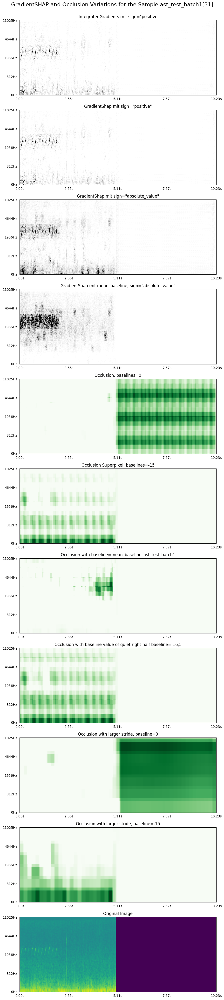

In [87]:
# Visualization GradientSHAP and Occlusion Test 

# Adjust the 3 variables below:
number_of_subplots = 11
original_np = ast_test_batch1_sample_np
main_title = "GradientSHAP and Occlusion Variations for the Sample ast_test_batch1[31]"

# create subplots
fig, axs = plt.subplots(nrows=number_of_subplots, ncols=1, figsize=(9.4, (3.75 * number_of_subplots)))
fig.suptitle(main_title, fontsize=16, y=1)

# Adjust the 3 variables below:
subplot_nr = 1
attribution = attributions_ig_test_expanded_ast
title = 'IntegratedGradients mit sign="positive'
viz.visualize_image_attr(attribution,
                         original_np,
                         method="heat_map",
                         #sign="absolute_value",
                         sign="positive",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[subplot_nr-1]),
                         cmap=default_cmap,
                         outlier_perc=1,
                         show_colorbar=False)
axs[subplot_nr-1].invert_yaxis(); axs[subplot_nr-1].set_aspect('auto'); axs[subplot_nr-1].title.set_text(title)

# Adjust the 3 variables below:
subplot_nr = 2
attribution = attributions_gs_test_expanded_ast
title = 'GradientShap mit sign="positive"'
viz.visualize_image_attr(attribution,
                         original_np,
                         method="heat_map",
                         sign="positive",
                         # sign="absolute_value",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[subplot_nr-1]),
                         cmap=default_cmap,
                         outlier_perc=1,
                         show_colorbar=False)
axs[subplot_nr-1].invert_yaxis(); axs[subplot_nr-1].set_aspect('auto'); axs[subplot_nr-1].title.set_text(title)

# Adjust the 3 variables below:
subplot_nr = 3
attribution = attributions_gs_test_expanded_ast
title = 'GradientShap mit sign="absolute_value"'
viz.visualize_image_attr(attribution,
                         original_np,
                         method="heat_map",
                         #sign="positive",
                         sign="absolute_value",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[subplot_nr-1]),
                         cmap=default_cmap,
                         outlier_perc=1,
                         show_colorbar=False)
axs[subplot_nr-1].invert_yaxis(); axs[subplot_nr-1].set_aspect('auto'); axs[subplot_nr-1].title.set_text(title)

# Adjust the 3 variables below:
subplot_nr = 4
attribution = attributions_gs_ast_test_meanbaseline_expanded
title = 'GradientShap mit mean_baseline, sign="absolute_value"'
viz.visualize_image_attr(attribution,
                         original_np,
                         method="heat_map",
                         #sign="positive",
                         sign="absolute_value",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[subplot_nr-1]),
                         cmap=default_cmap,
                         outlier_perc=1,
                         show_colorbar=False)
axs[subplot_nr-1].invert_yaxis(); axs[subplot_nr-1].set_aspect('auto'); axs[subplot_nr-1].title.set_text(title)


# Adjust the 3 variables below:
subplot_nr = 5
attribution = attributions_oc_test_expanded_ast
title = 'Occlusion, baselines=0'
viz.visualize_image_attr(attribution,
                         original_np,
                         method="heat_map",
                         sign="positive",
                         #sign="all",
                         #sign="absolute_value",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[subplot_nr-1]),
                         #cmap=default_cmap,
                         outlier_perc=1,
                         show_colorbar=False)
axs[subplot_nr-1].invert_yaxis(); axs[subplot_nr-1].set_aspect('auto'); axs[subplot_nr-1].title.set_text(title)

# Adjust the 3 variables below:
subplot_nr = 6
attribution = attributions_oc_ast_test_superpixel_expanded
title = 'Occlusion Superpixel, baselines=-15'
viz.visualize_image_attr(attribution,
                         original_np,
                         method="heat_map",
                         sign="positive",
                         #sign="absolute_value",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[subplot_nr-1]),
                         #cmap=default_cmap,
                         outlier_perc=1,
                         show_colorbar=False)
axs[subplot_nr-1].invert_yaxis(); axs[subplot_nr-1].set_aspect('auto'); axs[subplot_nr-1].title.set_text(title)

# Adjust the 3 variables below:
subplot_nr = 7
attribution = attributions_oc_ast_test_superpixelmean_expanded
title = 'Occlusion with baseline=mean_baseline_ast_test_batch1'
viz.visualize_image_attr(attribution,
                         original_np,
                         method="heat_map",
                         sign="positive",
                         #sign="absolute_value",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[subplot_nr-1]),
                         #cmap=default_cmap,
                         outlier_perc=1,
                         show_colorbar=False)
axs[subplot_nr-1].invert_yaxis(); axs[subplot_nr-1].set_aspect('auto'); axs[subplot_nr-1].title.set_text(title)

# Adjust the 3 variables below:
subplot_nr = 8
attribution = attributions_oc_ast_test_superpixelnull_expanded
title = 'Occlusion with baseline value of quiet right half baseline=-16,5'
viz.visualize_image_attr(attribution,
                         original_np,
                         method="heat_map",
                         sign="positive",
                         #sign="absolute_value",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[subplot_nr-1]),
                         #cmap=default_cmap,
                         outlier_perc=1,
                         show_colorbar=False)
axs[subplot_nr-1].invert_yaxis(); axs[subplot_nr-1].set_aspect('auto'); axs[subplot_nr-1].title.set_text(title)

# Adjust the 3 variables below:
subplot_nr = 9
attribution = attributions_oc_ast_test_stride_expanded
title = 'Occlusion with larger stride, baseline=0'
viz.visualize_image_attr(attribution,
                         original_np,
                         method="heat_map",
                         sign="positive",
                         #sign="absolute_value",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[subplot_nr-1]),
                         #cmap=default_cmap,
                         outlier_perc=1,
                         show_colorbar=False)
axs[subplot_nr-1].invert_yaxis(); axs[subplot_nr-1].set_aspect('auto'); axs[subplot_nr-1].title.set_text(title)

# Adjust the 3 variables below:
subplot_nr = 10
attribution = attributions_oc_ast_test_largerstride_superpixelmin15_expanded
title = 'Occlusion with larger stride, baseline=-15'
viz.visualize_image_attr(attribution,
                         original_np,
                         method="heat_map",
                         sign="positive",
                         #sign="absolute_value",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[subplot_nr-1]),
                         #cmap=default_cmap,
                         outlier_perc=1,
                         show_colorbar=False)
axs[subplot_nr-1].invert_yaxis(); axs[subplot_nr-1].set_aspect('auto'); axs[subplot_nr-1].title.set_text(title)

# Adjust the 3 variables below:
subplot_nr = 11
attribution = None
title = 'Original Image'
viz.visualize_image_attr(attribution,
                         original_np,
                         method="original_image",
                         sign="positive",
                         #sign="absolute_value",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[subplot_nr-1]),
                         #cmap=default_cmap,
                         outlier_perc=1,
                         show_colorbar=False)
axs[subplot_nr-1].invert_yaxis(); axs[subplot_nr-1].set_aspect('auto'); axs[subplot_nr-1].title.set_text(title)

# set axis labels
time_axis = calculate_time_axis(original_np, sample_rate, hop_length)
for ax in axs:
    set_axis_labels(ax, original_np, time_axis, mel_frequencies)

plt.tight_layout()
plt.show()

# 5 Weitere XAI-Methoden

In [88]:
# Sample from train_batch1

sample_id = 17

eff_train_batch1_sample = eff_train_batch1["input_values"][sample_id].unsqueeze(0)
eff_train_batch1_sample_np = np.squeeze(eff_train_batch1["input_values"][sample_id].numpy())
eff_train_batch1_sample_predindex = torch.max(loaded_eff_train_batch1_output_sigmoid, dim=1)[1][sample_id]

In [89]:
# IntegratedGradients

ig_eff = IntegratedGradients(efficientnet_model)

attributions_ig_expanded_eff, delta_ig_eff = calculate_attributions(
    ig_eff, 
    eff_train_batch1_sample, 
    eff_train_batch1_sample_predindex,
    baselines=eff_train_batch1_sample * 0,
    return_convergence_delta=True,
)

print('Approximation delta: ', abs(delta_ig_eff))


Approximation delta:  tensor([0.1916], dtype=torch.float64)


In [90]:
# NoiseTunnel
ig_eff = IntegratedGradients(efficientnet_model)
ignt_eff = NoiseTunnel(ig_eff)

attributions_ignt_expanded_eff, delta_ignt_eff = calculate_attributions(
    ignt_eff, 
    eff_train_batch1_sample, 
    eff_train_batch1_sample_predindex,
    baselines=eff_train_batch1_sample * 0,
    nt_type='smoothgrad_sq',
    nt_samples=100,
    stdevs=0.2,
    return_convergence_delta=True,
)

print('Approximation delta: ', abs(delta_ignt_eff))

Approximation delta:  tensor([0.0849, 0.1135, 0.0931, 0.2035, 0.2247, 0.2150, 0.0760, 0.2693, 0.1967,
        0.2087, 0.1865, 0.3200, 0.2897, 0.3266, 0.2394, 0.1098, 0.2764, 0.2914,
        0.2968, 0.0770, 0.2598, 0.1674, 0.1979, 0.0148, 0.1516, 0.2183, 0.1225,
        0.1602, 0.2416, 0.1072, 0.2502, 0.2667, 0.1538, 0.2344, 0.2731, 0.1187,
        0.2108, 0.3567, 0.0060, 0.1749, 0.1920, 0.1861, 0.2470, 0.1643, 0.0661,
        0.1226, 0.2467, 0.2183, 0.2904, 0.2021, 0.0360, 0.2201, 0.2248, 0.2757,
        0.1707, 0.2813, 0.1678, 0.1027, 0.0498, 0.1790, 0.2770, 0.0690, 0.2769,
        0.1621, 0.1794, 0.2519, 0.2259, 0.0620, 0.2610, 0.2635, 0.0375, 0.2206,
        0.2930, 0.1765, 0.1774, 0.1396, 0.0980, 0.2548, 0.1793, 0.1772, 0.0732,
        0.1593, 0.2815, 0.2253, 0.1967, 0.1660, 0.2122, 0.2224, 0.1751, 0.1489,
        0.0090, 0.1332, 0.2392, 0.0228, 0.1598, 0.1385, 0.1959, 0.1420, 0.1861,
        0.3187], dtype=torch.float64)


In [91]:
# GradientSHAP

gs_eff = GradientShap(efficientnet_model)

attributions_gs_expanded_eff, delta_gs_eff = calculate_attributions(
    gs_eff, 
    eff_train_batch1_sample, 
    eff_train_batch1_sample_predindex,
    n_samples=50,
    stdevs=0.0001,
    baselines=torch.cat([eff_train_batch1_sample * 0, eff_train_batch1_sample * 1]), # baseline-Verteilung besteht aus 2 Eingabebildern: input*0 (also schwarzes Bild) und input*1 (unverändertes bild),
    return_convergence_delta=True,
)

print('Approximation delta: ', abs(delta_gs_eff))

Approximation delta:  tensor([5.5059e-01, 6.4351e-01, 1.2144e+00, 5.4449e-01, 6.2704e-04, 8.7730e-01,
        4.4998e+01, 8.1117e-07, 5.4641e+00, 2.5152e-01, 1.8116e-06, 1.5191e-06,
        2.4863e-01, 7.0097e-07, 4.3836e-01, 1.9576e-06, 8.4346e-02, 1.4413e-06,
        1.8792e-06, 9.4041e-07, 1.3945e-06, 1.5355e-06, 1.4443e+00, 1.5445e-06,
        7.6106e-01, 2.9200e+00, 9.2938e+00, 5.4204e+00, 7.9973e+00, 8.6337e+00,
        9.1786e-01, 2.8312e-01, 1.8975e-02, 1.0342e-01, 1.4705e-06, 6.3406e-01,
        4.3256e+00, 1.8952e-06, 4.2147e-01, 1.5365e-06, 1.0572e-06, 2.4901e-01,
        5.5210e-01, 4.8884e-01, 7.3018e-02, 3.4535e+00, 1.3880e-01, 1.9424e-07,
        7.7269e+00, 1.0024e-06])


In [92]:
"""
# Occlusion

oc_eff = Occlusion(efficientnet_model)

attributions_oc_expanded_eff, delta_oc_eff = calculate_attributions(
    oc_eff, 
    eff_train_batch1_sample, 
    eff_train_batch1_sample_predindex,
    strides = (1, 8, 8),
    sliding_window_shapes=(1,15, 15),
    baselines=0
)

print('Approximation delta: ', abs(delta_oc_eff))

#attributions_oc_expanded_eff, delta_oc_eff
#ValueError: not enough values to unpack (expected 2, got 1)
"""

"\n# Occlusion\n\noc_eff = Occlusion(efficientnet_model)\n\nattributions_oc_expanded_eff, delta_oc_eff = calculate_attributions(\n    oc_eff, \n    eff_train_batch1_sample, \n    eff_train_batch1_sample_predindex,\n    strides = (1, 8, 8),\n    sliding_window_shapes=(1,15, 15),\n    baselines=0\n)\n\nprint('Approximation delta: ', abs(delta_oc_eff))\n\n#attributions_oc_expanded_eff, delta_oc_eff\n#ValueError: not enough values to unpack (expected 2, got 1)\n"

In [93]:
# DeepLift
from captum.attr import DeepLift
deep_lift_eff = DeepLift(efficientnet_model)

attributions_dl_expanded_eff, delta_dl_eff = calculate_attributions(
    deep_lift_eff, 
    eff_train_batch1_sample, 
    eff_train_batch1_sample_predindex,
    baselines=torch.zeros_like(eff_train_batch1_sample) * 0, # Null-Baseline
    return_convergence_delta=True,
)

print('Approximation delta: ', abs(delta_dl_eff))

Approximation delta:  tensor([0.4314])


In [94]:
#DeepLiftShap

from captum.attr import DeepLiftShap

deep_lift_shap_eff = DeepLiftShap(efficientnet_model)

# Number of baselines
num_baselines = 10

# create baselines
baselines = torch.stack([torch.zeros_like(eff_train_batch1_sample.squeeze(0)) for _ in range(num_baselines)])

# Since input sample has a batch dimension of 1, replicate the input to match the number of baselines for correct processing
inputs = eff_train_batch1_sample.repeat(num_baselines, 1, 1, 1)

# Calculate attributions
attributions_dls_eff = deep_lift_shap_eff.attribute(
    inputs,
    baselines=baselines,
    target=eff_train_batch1_sample_predindex
)
# Calculate medians
attributions_dls_median_eff = torch.median(attributions_dls_eff, dim=0)[0]

# Expand dimensions of the attributions tensor for further processing
attributions_dls_median_expanded_eff = np.expand_dims(attributions_dls_median_eff.squeeze().cpu().detach().numpy(), axis=2)

In [95]:
# FeatureAblation
"""
# dauert sehr lange, Abbruch nach 6400s

from captum.attr import FeatureAblation

feature_ablation_eff = FeatureAblation(efficientnet_model)

attributions_fa_eff = feature_ablation_eff.attribute(
    eff_train_batch1_sample,
    target=eff_train_batch1_sample_predindex,
    #feature_mask=feature_mask  # Optional, wenn bestimmte Features gruppiert ablatiert werden sollen
)
attributions_fa_expanded_eff = np.expand_dims(attributions_fa_eff.squeeze().cpu().detach().numpy(), axis=2)
"""

'\n# dauert sehr lange, Abbruch nach 6400s\n\nfrom captum.attr import FeatureAblation\n\nfeature_ablation_eff = FeatureAblation(efficientnet_model)\n\nattributions_fa_eff = feature_ablation_eff.attribute(\n    eff_train_batch1_sample,\n    target=eff_train_batch1_sample_predindex,\n    #feature_mask=feature_mask  # Optional, wenn bestimmte Features gruppiert ablatiert werden sollen\n)\nattributions_fa_expanded_eff = np.expand_dims(attributions_fa_eff.squeeze().cpu().detach().numpy(), axis=2)\n'

In [96]:
# Saliency

from captum.attr import Saliency

saliency_eff = Saliency(efficientnet_model)

attributions_sal_eff = saliency_eff.attribute(
    eff_train_batch1_sample,
    target=eff_train_batch1_sample_predindex
)
attributions_sal_expanded_eff = np.expand_dims(attributions_sal_eff.squeeze().cpu().detach().numpy(), axis=2)

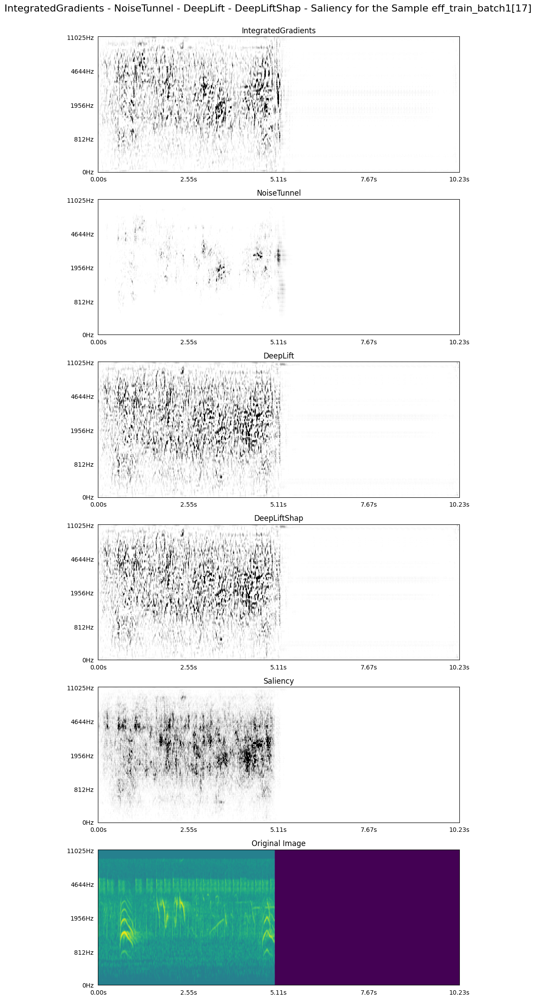

In [97]:
# Visualization XAI-Methods

# Adjust the 3 variables below:
number_of_subplots = 6
original_np = eff_train_batch1_sample_np
main_title = "IntegratedGradients - NoiseTunnel - DeepLift - DeepLiftShap - Saliency for the Sample eff_train_batch1[17]"

# create subplots
fig, axs = plt.subplots(nrows=number_of_subplots, ncols=1, figsize=(9.4, (3.75 * number_of_subplots)))
fig.suptitle(main_title, fontsize=16, y=1)

# Adjust the 3 variables below:
subplot_nr = 1
attribution = attributions_ig_expanded_eff
title = 'IntegratedGradients'
viz.visualize_image_attr(attribution,
                         original_np,
                         method="heat_map",
                         #sign="absolute_value",
                         sign="positive",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[subplot_nr-1]),
                         cmap=default_cmap,
                         outlier_perc=1,
                         show_colorbar=False)
axs[subplot_nr-1].invert_yaxis(); axs[subplot_nr-1].set_aspect('auto'); axs[subplot_nr-1].title.set_text(title)

# Adjust the 3 variables below:
subplot_nr = 2
attribution = attributions_ignt_expanded_eff
title = 'NoiseTunnel'
viz.visualize_image_attr(attribution,
                         original_np,
                         method="heat_map",
                         sign="positive",
                         #sign="absolute_value",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[subplot_nr-1]),
                         cmap=default_cmap,
                         outlier_perc=1,
                         show_colorbar=False)
axs[subplot_nr-1].invert_yaxis(); axs[subplot_nr-1].set_aspect('auto'); axs[subplot_nr-1].title.set_text(title)

# Adjust the 3 variables below:
subplot_nr = 3
attribution = attributions_dl_expanded_eff
title = 'DeepLift'
viz.visualize_image_attr(attribution,
                         original_np,
                         method="heat_map",
                         sign="positive",
                         #sign="all",
                         #sign="absolute_value",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[subplot_nr-1]),
                         cmap=default_cmap,
                         outlier_perc=1,
                         show_colorbar=False)
axs[subplot_nr-1].invert_yaxis(); axs[subplot_nr-1].set_aspect('auto'); axs[subplot_nr-1].title.set_text(title)

# Adjust the 3 variables below:
subplot_nr = 4
attribution = attributions_dls_median_expanded_eff
title = 'DeepLiftShap'
viz.visualize_image_attr(attribution,
                         original_np,
                         method="heat_map",
                         sign="positive",
                         #sign="absolute_value",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[subplot_nr-1]),
                         cmap=default_cmap,
                         outlier_perc=1,
                         show_colorbar=False)
axs[subplot_nr-1].invert_yaxis(); axs[subplot_nr-1].set_aspect('auto'); axs[subplot_nr-1].title.set_text(title)

# Adjust the 3 variables below:
subplot_nr = 5
attribution = attributions_sal_expanded_eff
title = 'Saliency'
viz.visualize_image_attr(attribution,
                         original_np,
                         method="heat_map",
                         sign="positive",
                         #sign="absolute_value",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[subplot_nr-1]),
                         cmap=default_cmap,
                         outlier_perc=1,
                         show_colorbar=False)
axs[subplot_nr-1].invert_yaxis(); axs[subplot_nr-1].set_aspect('auto'); axs[subplot_nr-1].title.set_text(title)

# Adjust the 3 variables below:
subplot_nr = 6
attribution = None
title = 'Original Image'
viz.visualize_image_attr(attribution,
                         original_np,
                         method="original_image",
                         sign="positive",
                         #sign="absolute_value",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[subplot_nr-1]),
                         cmap=default_cmap,
                         outlier_perc=1,
                         show_colorbar=False)
axs[subplot_nr-1].invert_yaxis(); axs[subplot_nr-1].set_aspect('auto'); axs[subplot_nr-1].title.set_text(title)

# set axis labels
time_axis = calculate_time_axis(original_np, sample_rate, hop_length)
for ax in axs:
    set_axis_labels(ax, original_np, time_axis, mel_frequencies)

plt.tight_layout()
plt.show()

## 4.4 TODO: weg? Visualisierung einzelnes Sample eines Modells 3 Methoden plus Original

Sample11_train_batch1 AST


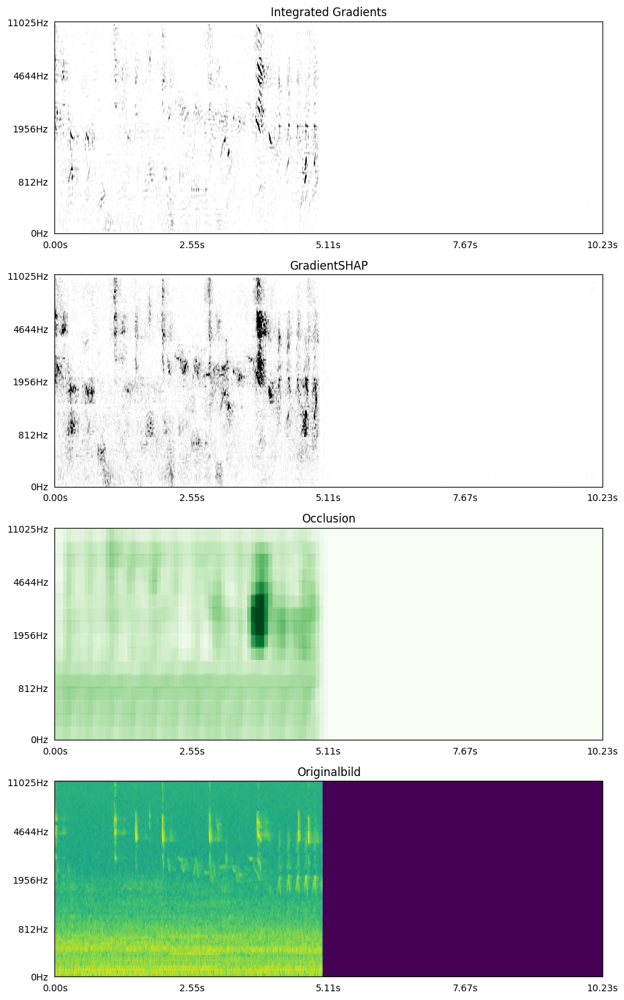

In [98]:
# TODO weg? Visualisierung 3 Methoden plus Original:

import matplotlib.pyplot as plt
from captum.attr import visualization as viz
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import FuncFormatter

sample_key = 'Sample11_train_batch1'
model_key = 'AST'
sample_model = attributions_data[sample_key][model_key]
print(sample_key, model_key)

# Erstellung von Subplots
# Breite und Höhe von Heatmap und Originalbild ändern sich, wenn figsize verändert wird 
fig, axs = plt.subplots(4, 1, figsize=(9.4, 15))  

# Berechnen der Zeitachse für das Spektrogramm
time_axis = librosa.frames_to_time(np.arange(sample_model['original'].squeeze().shape[1]), sr=sample_rate, hop_length=hop_length)

# Integrated Gradients Attributionswerte (Heatmap)
viz.visualize_image_attr(sample_model['Integrated Gradients'],
                         sample_model['original'].squeeze(),
                         method="heat_map",
                         sign="positive",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[0]),
                         cmap=default_cmap,
                         outlier_perc=1,
                         show_colorbar=False)
axs[0].invert_yaxis() 
axs[0].title.set_text('Integrated Gradients')
axs[0].set_aspect('auto')


# GradientSHAP Attributionswerte (Heatmap)
viz.visualize_image_attr(sample_model['GradientSHAP'],
                         sample_model['original'].squeeze(),
                         method="heat_map",
                         #sign="positive",
                         sign="absolute_value",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[1]),
                         cmap=default_cmap,
                         #outlier_perc=1,
                         show_colorbar=False)
axs[1].invert_yaxis() 
axs[1].title.set_text('GradientSHAP')
axs[1].set_aspect('auto')


# Occlusion Attributionswerte (Heatmap)
viz.visualize_image_attr(sample_model['Occlusion'],
                         sample_model['original'].squeeze(),
                         method="heat_map",
                         sign="positive",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[2]),
                         #cmap=default_cmap,
                         outlier_perc=2,
                         show_colorbar=False)
axs[2].invert_yaxis() 
axs[2].title.set_text('Occlusion')
axs[2].set_aspect('auto')


# Originalbild
viz.visualize_image_attr(None,
                         sample_model['original'].squeeze(),
                         method="original_image",
                         use_pyplot=False,
                         plt_fig_axis=(fig, axs[3]),
                         cmap=default_cmap,
                         show_colorbar=True)
axs[3].invert_yaxis() 
axs[3].title.set_text('Originalbild')
axs[3].set_aspect('auto')


# Setze die Achsenbeschriftungen für alle Grafiken
for ax in axs:
    # Zeitachse skalieren und formatieren
    ax.set_xticks(np.linspace(0, sample_model['original'].squeeze().shape[1] - 1, 5))
    ax.set_xticklabels(['{:.2f}s'.format(t) for t in time_axis[np.linspace(0, len(time_axis) - 1, 5, dtype=int)]])
    # Frequenzachse skalieren und formatieren
    y_ticks = np.linspace(0, 127, 5, dtype=int)  # gleichmäßige Verteilung über die Y-Achse
    ax.set_yticks(y_ticks)
    ax.set_yticklabels(['{:.0f}Hz'.format(m) for m in mel_frequencies[y_ticks]])

plt.tight_layout()
plt.show()

# 6 - Visualisierung als Matrix

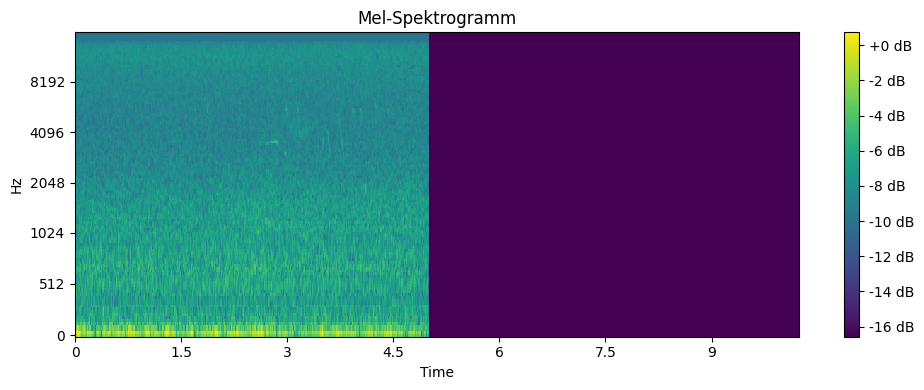

In [99]:
show_spectrogram(attributions_data['Sample22_test_batch1']['EfficientNet']['original'].squeeze(), sr=sample_rate, hop_length=hop_length, n_fft=n_fft)

In [100]:
viz.visualize_image_attr(
    None,
    attributions_data['Sample22_test_batch1']['EfficientNet']['original'].squeeze(), 
    method="original_image",
    #sign="positive", 
    use_pyplot=False, 
    plt_fig_axis=(fig, ax),
    cmap=default_cmap, 
    #outlier_perc=1, 
    show_colorbar=False
)
plt.show()

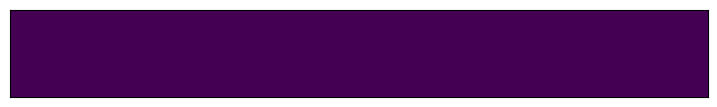

In [101]:
# Erstellen von Figure und Axes
fig, ax = plt.subplots(figsize=(9, 3.75))  # Angemessene Größe für Ihre Darstellung

# Nutzung der visualize_image_attr-Funktion
viz.visualize_image_attr(
    None,
    attributions_data['Sample22_test_batch1']['EfficientNet']['original'].squeeze(),
    method="original_image",
    sign="absolute_value",  # Wenn benötigt, sonst können Sie diesen Parameter auch weglassen
    use_pyplot=False,
    plt_fig_axis=(fig, ax),
    cmap=default_cmap,
    show_colorbar=False  # Hier können Sie entscheiden, ob eine Farblegende gezeigt werden soll
)

# Zeigen des Plots
plt.show()

In [102]:
attributions_data.keys()

dict_keys(['Sample16_train_batch1', 'Sample17_train_batch1', 'Sample31_train_batch1', 'Sample11_train_batch1', 'Sample31_test_batch1', 'Sample22_test_batch1', 'Sample61_test_batch1', 'Sample46_test_batch1'])

In [103]:
for i in [31, 16]:
    print("Sample",i, "train_batch1")
    eff_train_batch1_example_true_label = torch.argmax(eff_train_batch1["labels"][i]) # Index des höchsten Werts)
    print("True label: ", eff_train_batch1_example_true_label.item())
    print(" EfficientNet prediction score: " , loaded_eff_train_batch1_prediction_scores[i].item())
    print(" EfficientNet prediction_label: " , loaded_eff_train_batch1_prediction_label_indexes[i].item())
    #print(" EfficientNet output_sigmoid: " , loaded_eff_train_batch1_output_sigmoid[i])


    print(" AST prediction score: " , loaded_ast_train_batch1_prediction_scores[i].item())
    print(" AST prediction_label: " , loaded_ast_train_batch1_prediction_label_indexes[i].item())
    #print(" AST output_sigmoid: " , loaded_ast_train_batch1_output_sigmoid[i])
    print()

Sample 31 train_batch1
True label:  19
 EfficientNet prediction score:  0.9984960556030273
 EfficientNet prediction_label:  19
 AST prediction score:  0.9933924078941345
 AST prediction_label:  19

Sample 16 train_batch1
True label:  13
 EfficientNet prediction score:  0.9966722726821899
 EfficientNet prediction_label:  13
 AST prediction score:  0.9970378875732422
 AST prediction_label:  13



In [104]:
for i in [31, 22, 61, 46]:
    print("Sample",i, "test_batch1")
    eff_test_batch1_example_true_label = torch.argmax(eff_test_batch1["labels"][i]) # Index des höchsten Werts)
    print("True label: ", eff_test_batch1_example_true_label.item())
    #ast_train_batch1_example_true_label = torch.argmax(ast_train_batch1["labels"][i]) # Index des höchsten Werts)
    #print("True label: ", ast_train_batch1_example_true_label.item())
    print(" EfficientNet prediction score: " , loaded_eff_test_batch1_prediction_scores[i].item())
    print(" EfficientNet prediction_label: " , loaded_eff_test_batch1_prediction_label_indexes[i].item())
    #print(" EfficientNet output_sigmoid: " , loaded_eff_test_batch1_output_sigmoid[i])


    print(" AST prediction score: " , loaded_ast_test_batch1_prediction_scores[i].item())
    print(" AST prediction_label: " , loaded_ast_test_batch1_prediction_label_indexes[i].item())
    #print(" AST output_sigmoid: " , loaded_ast_test_batch1_output_sigmoid[i])
    print()

Sample 31 test_batch1
True label:  3
 EfficientNet prediction score:  0.886795163154602
 EfficientNet prediction_label:  3
 AST prediction score:  0.8207200169563293
 AST prediction_label:  3

Sample 22 test_batch1
True label:  1
 EfficientNet prediction score:  0.2985779047012329
 EfficientNet prediction_label:  1
 AST prediction score:  0.5814986824989319
 AST prediction_label:  17

Sample 61 test_batch1
True label:  1
 EfficientNet prediction score:  0.18788333237171173
 EfficientNet prediction_label:  11
 AST prediction score:  0.8258121609687805
 AST prediction_label:  1

Sample 46 test_batch1
True label:  1
 EfficientNet prediction score:  0.5425891280174255
 EfficientNet prediction_label:  3
 AST prediction score:  0.8687466382980347
 AST prediction_label:  3



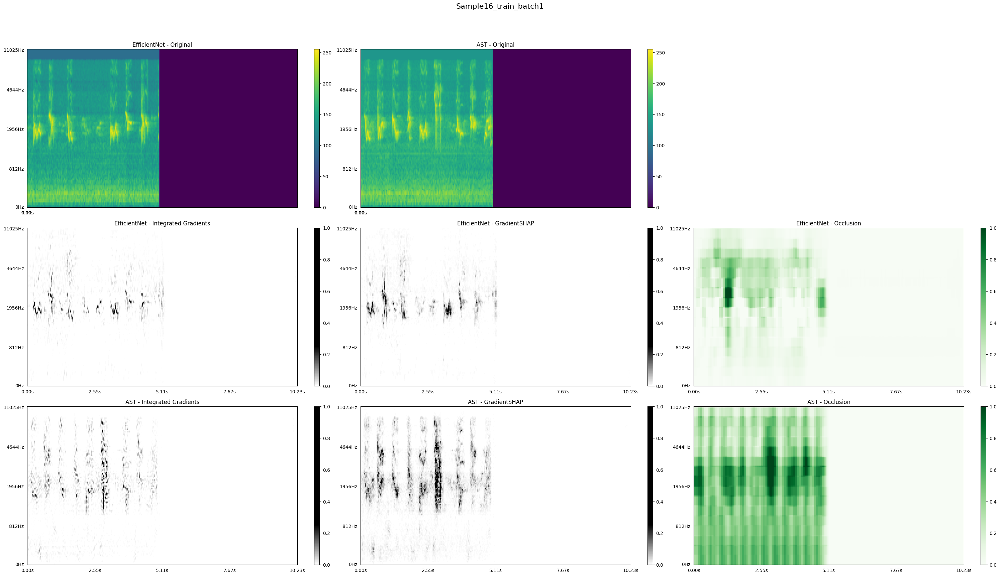

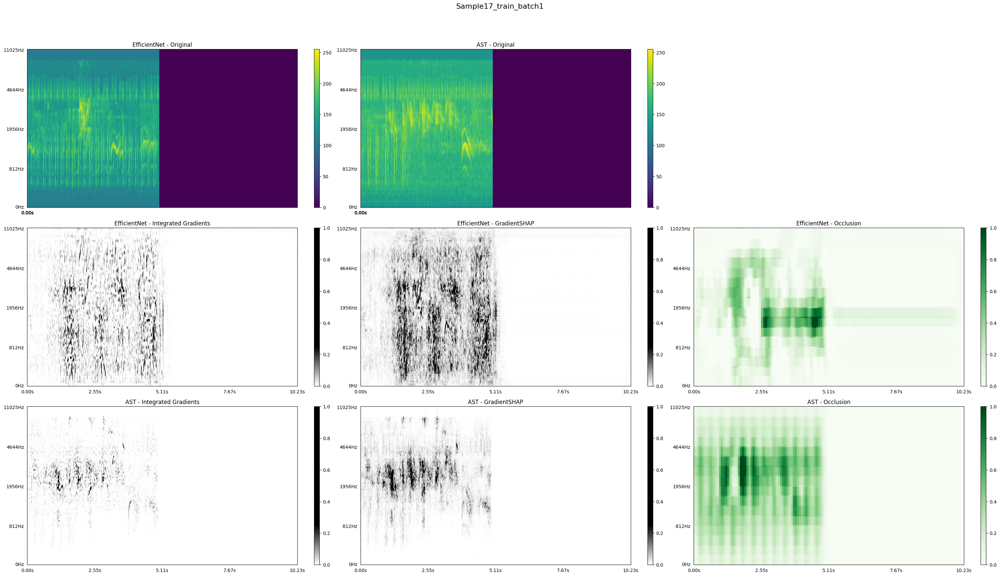

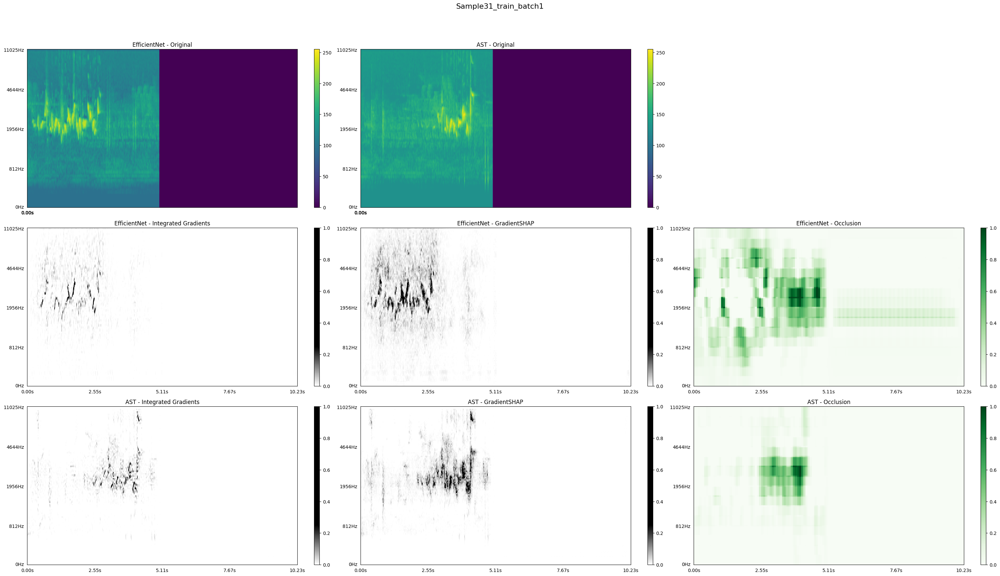

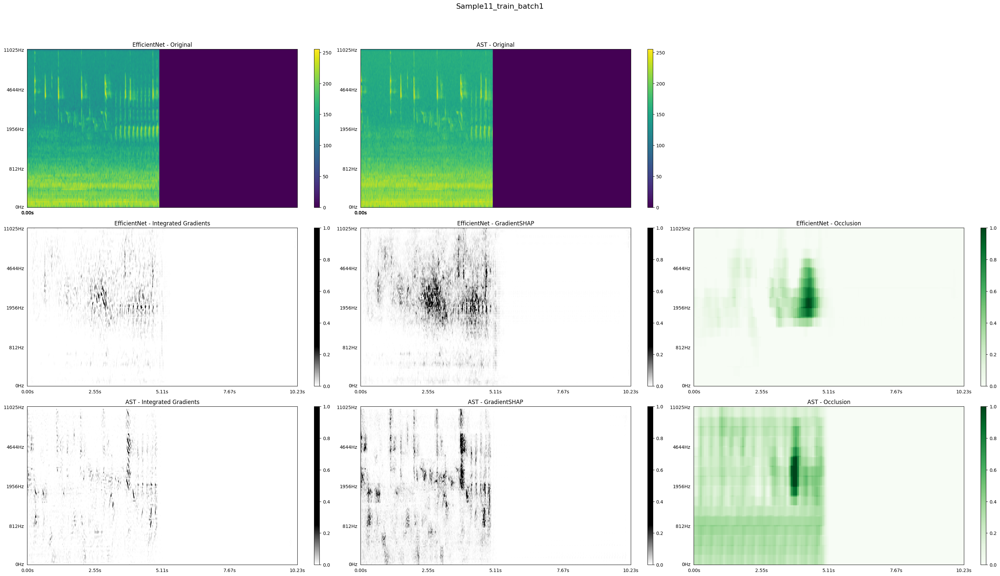

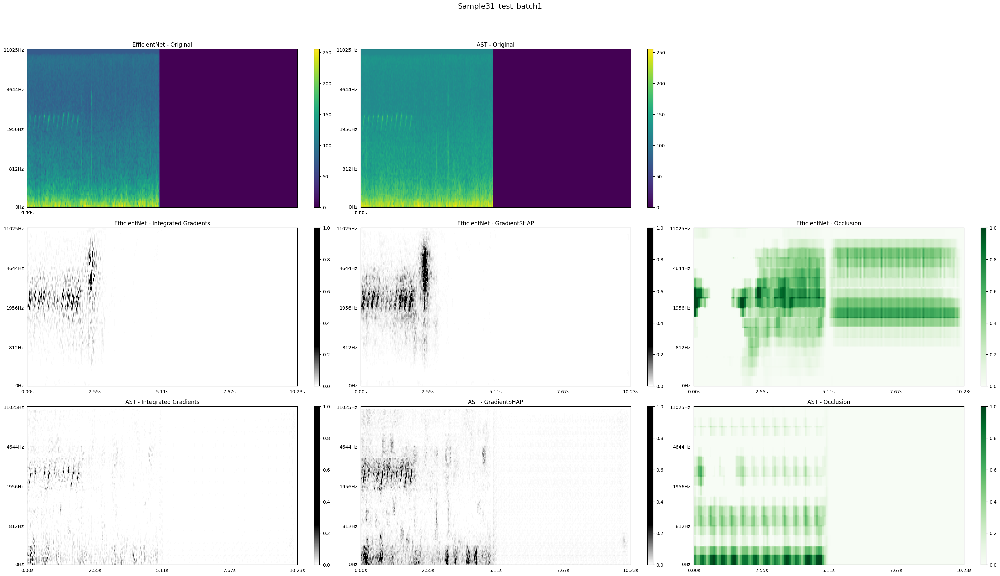

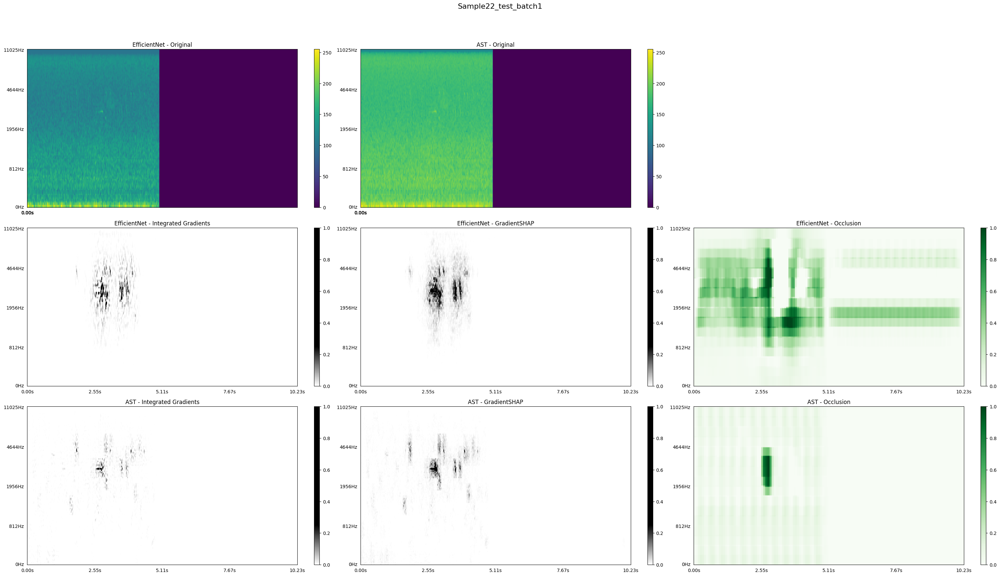

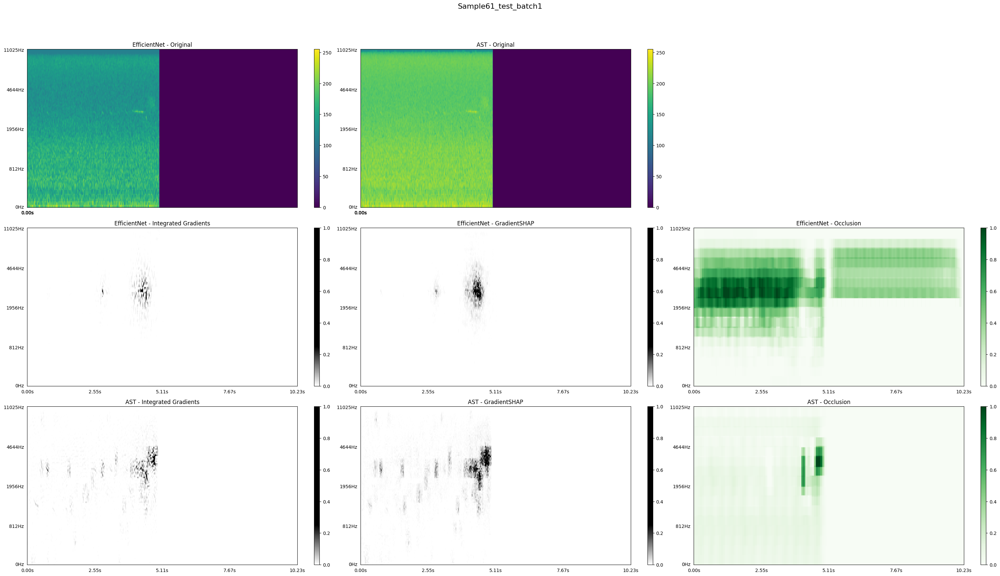

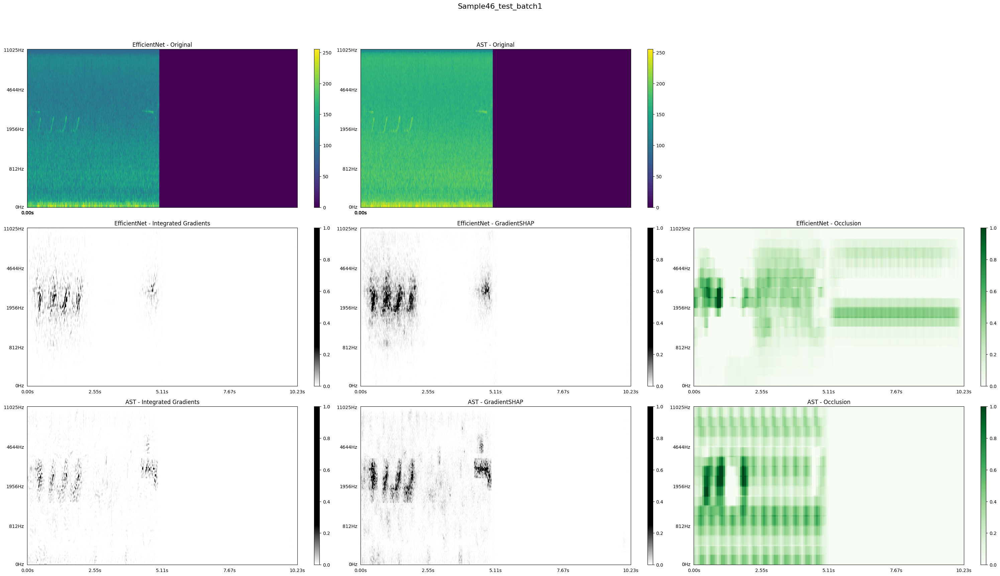

In [105]:
# Matrizen im ipynb anzeigen

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import librosa
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import FuncFormatter

# Modell- und Methodennamen
models = ['EfficientNet', 'AST']
methods = ['Integrated Gradients', 'GradientSHAP', 'Occlusion']


# Schleife über jedes Sample
for sample_name in attributions_data.keys():
    fig, axs = plt.subplots(3, 3, figsize=(30, 18))  # 3 Zeilen (1 für Originalbilder, 2 für Modelle), 3 Spalten (Methoden)
    fig.suptitle(sample_name, fontsize=16, va='center')

    # Zeile für die Original-Spektrogramme
    for i, model in enumerate(models):
        ax = axs[0, i]
        original_data = attributions_data[sample_name][model]['original']
        original_data_norm = (original_data - original_data.min()) / (original_data.max() - original_data.min())
        # print("Check Original Data Values:", original_data.min(), original_data.max(), original_data.mean())
        time_axis = librosa.frames_to_time(np.arange(original_data.shape[1]), sr=sample_rate, hop_length=hop_length)        
        
        viz.visualize_image_attr(
            None,
            np.squeeze(original_data_norm), 
            method="original_image",
            #sign="positive", 
            use_pyplot=False, 
            plt_fig_axis=(fig, ax),
            cmap=default_cmap, 
            #outlier_perc=1, 
            show_colorbar=False
        )
        ax.invert_yaxis()
        ax.title.set_text(f'{model} - Original')
        ax.set_aspect('auto')
        # if show_custom_colorbar:
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="2%", pad=0.5)
        cb = plt.colorbar(ax.get_images()[0], cax=cax, orientation='vertical')           
        # Zeit- und Frequenzachse für beide Grafiken anpassen
        ax.set_xticks(np.linspace(0, original_data.shape[1] - 1, 5))
        ax.set_xticklabels([f"{t:.2f}s" for t in time_axis[np.linspace(0, len(time_axis) - 1, 5, dtype=int)]])
        y_ticks = np.linspace(0, 127, 5, dtype=int)
        ax.set_yticks(y_ticks)
        ax.set_yticklabels([f"{m:.0f}Hz" for m in mel_frequencies[y_ticks]])  
    
    axs[0, 2].axis('off')  # Deaktiviere den dritten Subplot in der ersten Zeile, falls benötigt

    # Zeilen für die XAI-Methoden
    for i, model in enumerate(models):
        for j, xai_method in enumerate(methods):
            ax = axs[i + 1, j]  # Offset um eine Zeile nach unten verschieben
            data = attributions_data[sample_name][model][xai_method]
            original_data = attributions_data[sample_name][model]['original']
            original_data_norm = (original_data - original_data.min()) / (original_data.max() - original_data.min())
            # print("i, model, j, sample_name, xai_method: ", i, model, j, sample_name, xai_method)
            # print("data: ", data)
            time_axis = librosa.frames_to_time(np.arange(data.shape[1]), sr=sample_rate, hop_length=hop_length)        
            if xai_method == "Integrated Gradients":
                viz.visualize_image_attr(
                    data, 
                    #attributions_data[sample_name][model]['original'], 
                    np.squeeze(original_data_norm),
                    method="heat_map",
                    sign="positive",
                    use_pyplot=False, 
                    plt_fig_axis=(fig, ax),
                    cmap=default_cmap, 
                    outlier_perc=1, 
                    show_colorbar=False
                )
            if xai_method == "GradientSHAP":
                viz.visualize_image_attr(
                    data, 
                    #attributions_data[sample_name][model]['original'], 
                    np.squeeze(original_data_norm),
                    method="heat_map",
                    sign="absolute_value",
                    use_pyplot=False, 
                    plt_fig_axis=(fig, ax),
                    cmap=default_cmap, 
                    show_colorbar=False
                )
            if xai_method == "Occlusion":
                viz.visualize_image_attr(
                    data, 
                    #attributions_data[sample_name][model]['original'], 
                    np.squeeze(original_data_norm),
                    method="heat_map",
                    sign="positive", 
                    use_pyplot=False, 
                    plt_fig_axis=(fig, ax),
                    outlier_perc=2, 
                    show_colorbar=False
                )
            ax.invert_yaxis()
            ax.title.set_text(f'{model} - {xai_method}')
            ax.set_aspect('auto')
            # if show_custom_colorbar:
            divider = make_axes_locatable(ax)
            cax = divider.append_axes("right", size="2%", pad=0.5)
            cb = plt.colorbar(ax.get_images()[0], cax=cax, orientation='vertical')           
            # Zeit- und Frequenzachse für beide Grafiken anpassen
            ax.set_xticks(np.linspace(0, data.shape[1] - 1, 5))
            ax.set_xticklabels([f"{t:.2f}s" for t in time_axis[np.linspace(0, len(time_axis) - 1, 5, dtype=int)]])
            y_ticks = np.linspace(0, 127, 5, dtype=int)
            ax.set_yticks(y_ticks)
            ax.set_yticklabels([f"{m:.0f}Hz" for m in mel_frequencies[y_ticks]])                        
            
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Anpassung für den Haupttitel
    plt.show()

In [106]:
"""
# Matrix herunterladen

import matplotlib.pyplot as plt

fig_counter = 1
for sample_name in attributions_data.keys():
    fig, axs = plt.subplots(3, 3, figsize=(30, 18))  # 3 Zeilen (1 für Originalbilder, 2 für Modelle), 3 Spalten (Methoden)
    fig.suptitle(sample_name, fontsize=16, va='center')

    # Original-Spektrogramme
    for i, model in enumerate(models):
        ax = axs[0, i]
        original_data = attributions_data[sample_name][model]['original']
        visualize_subplot(ax, original_data, "original_image", False, True, f'Original {model}', 
                          FuncFormatter(lambda x, pos: f"{x:+.0f} dB"))
    axs[0, 2].axis('off')  # Deaktiviere den dritten Subplot in der ersten Zeile

    # XAI
    for i, model in enumerate(models):
        for j, method in enumerate(methods):
            ax = axs[i + 1, j]  # Offset um eine Zeile nach unten verschieben
            data = attributions_data[sample_name][model][method]
            visualize_subplot(ax, data, "heat_map", False, True, f'{model} - {method}')
            ax.set_title(f'{model} {method}', fontsize=12)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig(f"sample_{fig_counter}.png")  # Speichert jede Matrix als eigene Datei
    fig_counter += 1
    plt.close(fig)  # Schließt die aktuelle Figure, um Speicher freizugeben
"""

'\n# Matrix herunterladen\n\nimport matplotlib.pyplot as plt\n\nfig_counter = 1\nfor sample_name in attributions_data.keys():\n    fig, axs = plt.subplots(3, 3, figsize=(30, 18))  # 3 Zeilen (1 für Originalbilder, 2 für Modelle), 3 Spalten (Methoden)\n    fig.suptitle(sample_name, fontsize=16, va=\'center\')\n\n    # Original-Spektrogramme\n    for i, model in enumerate(models):\n        ax = axs[0, i]\n        original_data = attributions_data[sample_name][model][\'original\']\n        visualize_subplot(ax, original_data, "original_image", False, True, f\'Original {model}\', \n                          FuncFormatter(lambda x, pos: f"{x:+.0f} dB"))\n    axs[0, 2].axis(\'off\')  # Deaktiviere den dritten Subplot in der ersten Zeile\n\n    # XAI\n    for i, model in enumerate(models):\n        for j, method in enumerate(methods):\n            ax = axs[i + 1, j]  # Offset um eine Zeile nach unten verschieben\n            data = attributions_data[sample_name][model][method]\n            vi